# Projet 3 : Self-Supervised Learning (SSL) for Anomaly Detection

L'objectif de ce projet est de comparer différentes stratégies SSL, en les évaluant sur des tâches de détection d'anomalies.



- Rappelons le concept de SSL. On va utiliser en majorité des données non labelisées que l'on va modifier afin de pouvoir apprendre leurs représentations utiles. En effet, il est souvent coûteux ou difficile d'annoter de grandes quantités de données, mais beaucoup de données non labélisées sont disponibles. En utilisant une petite quantité de données étiquetées et une grande quantité de données qui ne le sont pas, on peut entraîner un modèle performant sans dépendre entièrement de l'annotation manuelle. 


- Nous évaluerons les différentes méthodes de SSL en faisant de la détection d'anomalies. Le concept de détection consiste à entraîner nos réseaux de neurones sur des données « normales » (sans anomalie) afin de leur apprendre à reconstruire les données initiales. Pour cela, nous dégradons les images de différentes façons afin de permettre au réseau d'en apprendre les caractéristiques visuelles et de savoir les reconstruire. Cette dégradation va nous permettre d'avoir une forme de labélisation en cherchant à reproduire l'image initiale, target. Après entraînement,  nous testons la reconstruction sur des données à la fois normales et anormales. Le modèle ayant appris sur des données normales, la reconstruction d'images avec anomalies ne devrait pas prendre en compte l'anomalie. Ainsi, la différence entre une image reconstruite anormale avec l'image anormale initiale sera plus grande que la différence entre l'image normale reconstruite et initiale. En établissant un seuil sur cette différence (score), nous serons capables d'identifier les images anormales.


La méthodologie de ce projet est la suivante : 
- Initialisation et étude des jeux de données
- Mise en place de 4 modèles de SSL : masque, inpainting, colorizing et puzzle
- Comparaison des différents modèles. 

## Importation des librairies: 

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
from PIL import Image


%matplotlib inline
import matplotlib.pyplot as plt

import matplotlib.image as mpimg

In [3]:
device = torch.device('cpu')

In [4]:
plt.close('all')

## Préparation des données

#### Création d'un fichier bad pour regrouper les photos avec anomalies

- Dans ce projet, on ne cherche pas à différencier les anomalies, nous cherchons uniquement à faire une détection anomalie ou non-anomalie (1 ou 0). Pour cela, nous avons besoin de 2 catégories dans le dossier test : 'good' regroupant les images sans anomalies et 'bad' regroupant les images avec anomalies. 

- Nous utilisons les jeux de données de  MVTec AD database et prenons les catégories bottle, hazelnut, capsule et toothbrush. Nous prenons aussi la catégorie engine wiring de AutoVI. 

In [ ]:
import os
import shutil

### Création d'une catégorie bad qui regroupe les images avec anomalie ###

source_directories = [
    'capsule/test/',
    'bottle/test/',
    'hazelnut/test/',
    'toothbrush/test/', 
    'engine_wiring/test'
]

target_directories = [
    'capsule/test/bad',
    'bottle/test/bad',
    'hazelnut/test/bad',
    'toothbrush/test/bad',
    'engine_wiring/test/bad'
]

# Parcour des images sources pour les mettre dans le dossier target
for source_directory, target_directory in zip(source_directories, target_directories):
    excluded_directory = os.path.join(source_directory, 'good')
    
    # Création du dossier target si il n'existe pas encore sur la machine 
    if not os.path.exists(target_directory):
        os.makedirs(target_directory)

        file_counter = 1

        for root, dirs, files in os.walk(source_directory):
            if excluded_directory in root:
                continue

            for file in files:
                source_file = os.path.join(root, file)

                new_file_name = f"{file_counter:03}.jpg"  
                destination_file = os.path.join(target_directory, new_file_name)
                shutil.copy(source_file, destination_file)
                print(f"Copié '{source_file}' vers '{destination_file}'")

                file_counter += 1
    else:
        print(f"Le dossier '{target_directory}' existe déjà.")


Le dossier 'capsule/test/bad' existe déjà.
Le dossier 'bottle/test/bad' existe déjà.
Le dossier 'hazelnut/test/bad' existe déjà.
Le dossier 'toothbrush/test/bad' existe déjà.
Le dossier 'engine_wiring/test/bad' existe déjà.


#### Téléchargement des images 

Nous créons une classe MVTecDataset afin de définir un loader qui nous permettra de récupérer nos images depuis leur dossier, de leur associer un label et de les transformer (redimensionner) si besoin.  

- Nous avons remarqué que le nombre d'images avec anomalie est beaucouo plus important que celui des images normales. Nous allons donc nous assurer que le nombre d'images avec anomalie et sans anomalie est le même, cela pour éviter de biaiser les résultats de la prédiction. 

In [6]:
import random

class MVTecDataset(Dataset):
    def __init__(self, root_dir, category, mode='train', transform=None, balance_classes=True):
        self.root_dir = root_dir
        self.category = category
        self.mode = mode
        self.transform = transform
        self.balance_classes = balance_classes  # Nouveau paramètre
        self.image_paths = []
        self.labels = []

        self._load_image_paths()

    def _load_image_paths(self):
        category_path = os.path.join(self.root_dir, self.category)

        if self.mode == 'train':
            normal_images_path = os.path.join(category_path, 'train/good')
        elif self.mode == 'test':
            normal_images_path = os.path.join(category_path, 'test/good')
            anormal_images_path = os.path.join(category_path, 'test/bad')
        else:
            raise ValueError("Mode should be 'train' or 'test'")

        # Charger les chemins des images normales
        normal_images = []
        for filename in os.listdir(normal_images_path):
            img_path = os.path.join(normal_images_path, filename)
            if os.path.isfile(img_path):
                normal_images.append(img_path)

        # Charger les chemins des images anormales si mode test
        anormal_images = []
        if self.mode == 'test':
            for filename in os.listdir(anormal_images_path):
                img_path = os.path.join(anormal_images_path, filename)
                if os.path.isfile(img_path):
                    anormal_images.append(img_path)

        # Équilibrer les classes si nécessaire
        if self.mode == 'test' and self.balance_classes:
            min_count = min(len(normal_images), len(anormal_images))
            normal_images = random.sample(normal_images, min_count)
            anormal_images = random.sample(anormal_images, min_count)

        # Ajouter les images et leurs labels
        self.image_paths.extend(normal_images)
        self.labels.extend([0] * len(normal_images))
        if self.mode == 'test':
            self.image_paths.extend(anormal_images)
            self.labels.extend([1] * len(anormal_images))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label


#### Création des datasets

- On transforme nos images afin qu'elles aient toutes la même dimension. On choisit une résolution 256x256 afin d'obtenir les résultats les plus précis possibles.
- On définit la taille du batch à 8. Après différents tests, 8 semble être le bon compromis. Il est important de se rappeler que nos datasets d'entraînement donc sans anomalie contiennent peu d'images.
- On définit des échantillons de train et de test pour chaque jeu de données. On entraîne sur des images sans anomalies et on teste sur un subset d'images avec et sans anomalie. La proportion de données train et test est donnée par la construction des dossiers fournis au départ. 

In [ ]:
batch_size = 8  

transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir l'image en Tensor
    transforms.Resize((256, 256)),  # Redimensionner les images         
])

# Train
root_dir = ''
capsule_train = MVTecDataset(root_dir=root_dir, category='capsule',mode='train', transform=transform)
capsule_train_loader = DataLoader(capsule_train, batch_size=batch_size, shuffle=True)

bottle_train = MVTecDataset(root_dir=root_dir, category='bottle',mode='train', transform=transform)
bottle_train_loader = DataLoader(bottle_train, batch_size=batch_size, shuffle=True)

hazelnut_train = MVTecDataset(root_dir=root_dir, category='hazelnut',mode='train', transform=transform)
hazelnut_train_loader = DataLoader(hazelnut_train, batch_size=batch_size, shuffle=True)

toothbrush_train = MVTecDataset(root_dir=root_dir, category='toothbrush',mode='train', transform=transform)
toothbrush_train_loader = DataLoader(toothbrush_train, batch_size=batch_size, shuffle=True)

engine_train = MVTecDataset(root_dir=root_dir, category='engine_wiring',mode='train', transform=transform)
engine_train_loader = DataLoader(engine_train, batch_size=batch_size, shuffle=True)

# Test 
capsule_test = MVTecDataset(root_dir=root_dir, category='capsule',mode='test', transform=transform)
capsule_test_loader = DataLoader(capsule_test, batch_size=batch_size, shuffle=True)

bottle_test = MVTecDataset(root_dir=root_dir, category='bottle',mode='test', transform=transform)
bottle_test_loader = DataLoader(bottle_test, batch_size=batch_size, shuffle=True)

hazelnut_test = MVTecDataset(root_dir=root_dir, category='hazelnut',mode='test', transform=transform)
hazelnut_test_loader = DataLoader(hazelnut_test, batch_size=batch_size, shuffle=True)

toothbrush_test = MVTecDataset(root_dir=root_dir, category='toothbrush',mode='test', transform=transform)
toothbrush_test_loader = DataLoader(toothbrush_test, batch_size=batch_size, shuffle=True)

engine_test = MVTecDataset(root_dir=root_dir, category='engine_wiring',mode='test', transform=transform)
engine_test_loader = DataLoader(engine_test, batch_size=batch_size, shuffle=True)

#### Affichage d'images 

Afin de mieux se rendre compte des images que l'on manipule nous allons en afficher certaines pour chaque catégorie. 

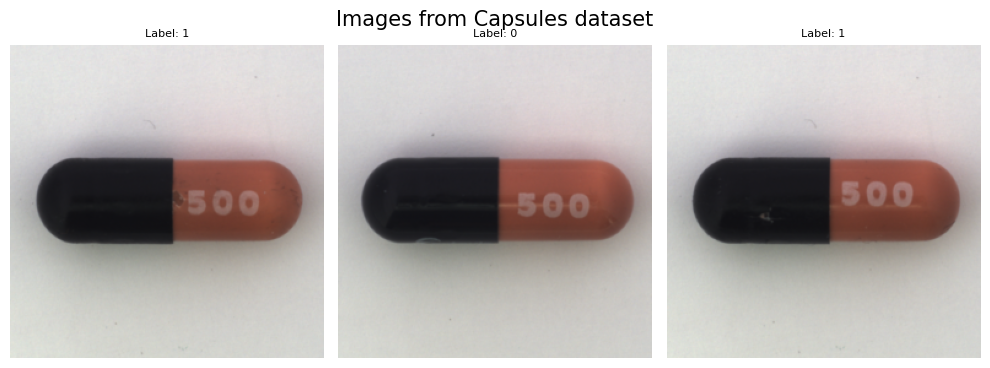

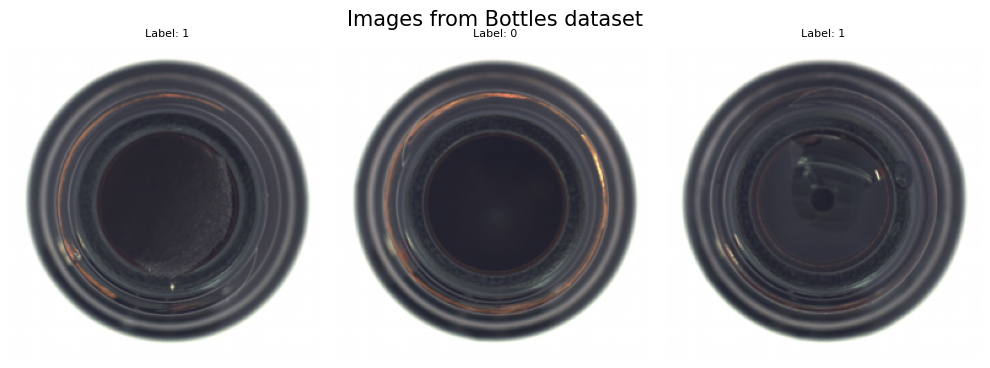

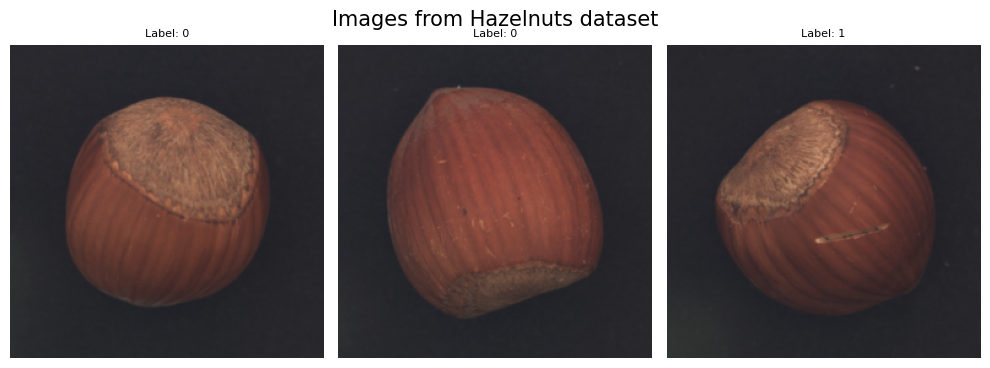

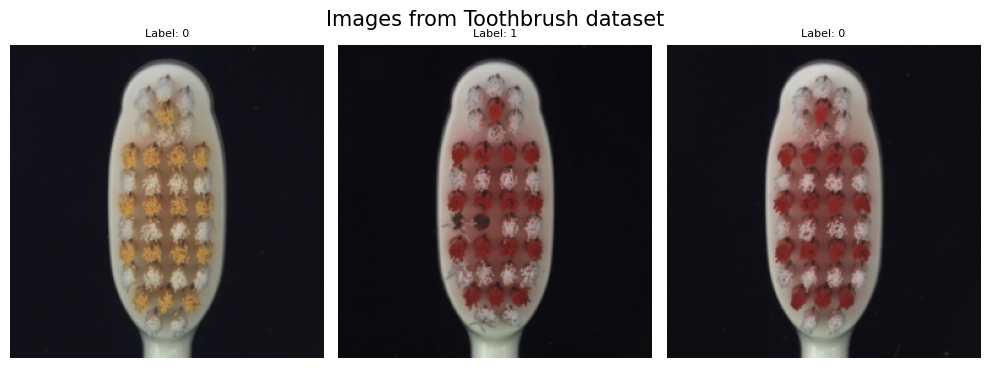

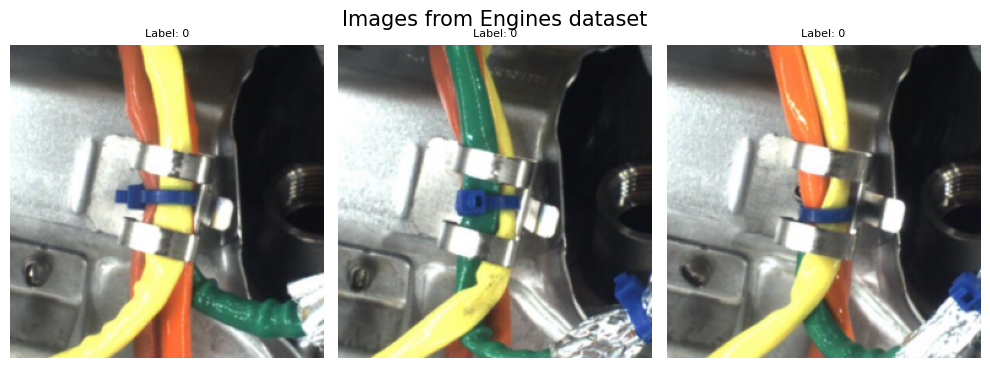

In [ ]:
# Liste des loaders et des titres associés
loaders = [
    ("Capsules", capsule_test_loader),
    ("Bottles", bottle_test_loader),
    ("Hazelnuts", hazelnut_test_loader),
    ("Toothbrush", toothbrush_test_loader),
    ("Engines", engine_test_loader),
]


for title, loader in loaders:
    images, labels = next(iter(loader))
    
    images = images.cpu().numpy()
    images = np.transpose(images, (0, 2, 3, 1))  # Convertir de (B, C, H, W) à (B, H, W, C)
    

    images = np.clip(images, 0, 1)  # Clip les valeurs entre 0 et 1

    fig, axes = plt.subplots(1, 3, figsize=(10, 4))  
    axes = axes.ravel()

    for i in range(3):  
        ax = axes[i]
        ax.imshow(images[i])
        ax.set_title(f"Label: {labels[i].item()}", fontsize=8)
        ax.axis('off')

    plt.tight_layout()
    plt.suptitle(f"Images from {title} dataset", fontsize=15)
    plt.show()

#### Vérifier l'équilibre des classes

- Afin d'avoir une classification qui n'est pas biaisée nous nous assurons qu'il y ait le même nombre d'images dans chaque catégories (bad ou good) de chaque datasets. Nous vérifions ici que le dataloader ait correctement fait cette sélection. 

In [ ]:
from collections import Counter

def count_images_by_class(dataset):
    labels = [label for _, label in dataset]  
    label_counts = Counter(labels)  
    
    return label_counts


In [ ]:
categories = ["capsule","bottle","hazelnut","toothbrush","engine_wiring"]
for cat in categories :              
    dataset = MVTecDataset(
        root_dir=".",
        category=cat,
        mode="test",
        transform=transforms.ToTensor()
    )

    counts = count_images_by_class(dataset)

    print(cat,counts)

capsule Counter({0: 23, 1: 23})
bottle Counter({0: 20, 1: 20})
hazelnut Counter({0: 40, 1: 40})
toothbrush Counter({0: 12, 1: 12})
engine_wiring Counter({0: 285, 1: 285})


- Nous avons bien la même proportion d'images avec et sans anomalies pour les données de test. 

### Architecture de l'encodeur

Nous créons un encodeur et un décodeur afin de réduire la dimension de nos données à des espaces latents, et d'apprendre à reconstruire nos images à partir de ces représentations latentes. 

Nous avons essayé différentes profondeurs et architectures afin d'obtenir un modèle performant. Nous remarquons que les réseaux plus profond nous donnent de meilleures performances. Nous allons alors jusqu'à 512 ce qui nous permet d'avoir une reconstruction d'image convenable sans avoir un réseau trop couteux. 

#### Principe de l'encodeur : 
L'encodeur permet de représenter l'image (l'entrée) dans un espace de dimensions réduites (espace latent) en capturant les caractéristiques principales de l'image. On le construit avec une série de couches convolutives, normalisation par batch et activation. 
- La convolution 2D (nn.Conv2d) : extrait des caractéristiques locales de l'image
- La normalisation par batch (nn.BatchNorm2d) : stabilise et accélère l'entraînement
- La fonction d'activation (nn.LeakyReLU) :  capturer des relations plus complexes, non-linéaires
- On effectue différentes couches pour réduire la taille spatiale des données, mais augmenter le nombre de canaux, cela nous permet de gagner en précision lors de notre reconstruction. 

#### Principe du décodeur : 
Le décodeur permet de reconstruire l'image à partir des espaces latents. Il effectue l'inverse de l'encodeur. Il reçoit une entrée de petite dimension, il y applique les transformations inverses de l'encodeur pour obtenir une sortie de grande dimension (taille de l'entrée de l'encodeur). 
- L'activation de la couche de sortie est sigmoid, on a normalisé les pixels sur une échelle [0,1] et sort un vecteur appartenant à cet intervalle donc cette fonction est particulièrement adaptée à la reconstruction d'images.

In [ ]:
class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),         
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),       
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),     
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, latent_dim, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(latent_dim),
            nn.LeakyReLU(0.2),
        )
    
    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=3):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),        
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),       
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),        
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),
        )
    
    def forward(self, x):
        return self.decoder(x)

## Fonction d'entraînement

Nous définissons une fonction qui va nous permettre d'entraîner l'AE définit précédemment pour qu'il apprenne à reconstruire les images données en entrée. Sur différentes époques, nous calculons la loss et mettons à jour les poids du réseau à l'aide d'un optimiseur afin de minimiser cette loss à chaque itération. Nous évaluons le modèle sur des données de tests. 

In [ ]:
def train_ssl_model(model, 
                    train_loader, 
                    test_loader,  
                    criterion, 
                    optimizer, 
                    device=device, 
                    epochs=10):
    train_losses = []  
    val_losses = []    

    for epoch in range(epochs):
        model.to(device)
        model.train()
        total_train_loss = 0

        for images, _ in train_loader:
            images = images.to(device)
            optimizer.zero_grad()
            output, _ = model(images) 
            loss = criterion(output, images)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)  

        # Évaluation
        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for images, _ in test_loader:
                images = images.to(device)
                output, _ = model(images)
                val_loss = criterion(output, images)
                total_val_loss += val_loss.item()

        avg_val_loss = total_val_loss / len(test_loader)
        val_losses.append(avg_val_loss)  

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    return model.encoder, train_losses, val_losses

### Visualiser les résultats 

Nous créons une fonction afin de visualier l'image initiale, l'image dégradée et la reconstruction. Nous ajoutons aussi l'affichage de la courbe ROC de la prédiciton d'anomalie. 

In [ ]:
import random
import matplotlib.pyplot as plt
import torch
from sklearn.metrics import roc_curve, auc

def visualize_reconstructions_with_anomalies(model, anomaly_detector, data_loader, device, num_images):
    
    model.eval()
    anomaly_detector.eval()

    dataset = list(data_loader.dataset)
    
    random_indices = random.sample(range(len(dataset)), num_images)
    random_samples = [dataset[i] for i in random_indices]  
    random_images = [sample[0] for sample in random_samples] 
    true_labels = [sample[1] for sample in random_samples]  

    # Convertir les images en un batch
    images = torch.stack(random_images).to(device)
    true_labels = torch.tensor(true_labels).to(device)

    
    with torch.no_grad():
        reconstructed_images, perturbed_images = model(images)  
        anomaly_scores = anomaly_detector.compute_anomaly_score(images)  
        predicted_labels = (anomaly_scores > anomaly_detector.threshold).cpu().numpy()  

    # Convertir les données sur CPU pour la visualisation
    images = images.cpu()
    reconstructed_images = reconstructed_images.cpu()
    perturbed_images = perturbed_images.cpu()
    true_labels = true_labels.cpu().numpy()

    all_scores, all_labels = anomaly_detector.evaluate_anomaly_detection(data_loader)
    fpr, tpr, _ = roc_curve(all_labels, all_scores)
    roc_auc = auc(fpr, tpr)

    fig, axes = plt.subplots(num_images, 4, figsize=(16, num_images * 4))  
    

    if num_images == 1:
        axes = np.expand_dims(axes, axis=0)  
        
    for i in range(num_images):
        # Image dégradée (entrée au modèle)
        axes[i, 0].imshow(perturbed_images[i].permute(1, 2, 0).squeeze(), cmap='gray')
        axes[i, 0].set_title(f"Input\nTrue: {true_labels[i]}")
        axes[i, 0].axis('off')
        
        # Image originale (vérité terrain)
        axes[i, 1].imshow(images[i].permute(1, 2, 0))
        axes[i, 1].set_title(f"Ground Truth\nTrue: {true_labels[i]}")
        axes[i, 1].axis('off')
        
        # Image reconstruite par le modèle
        axes[i, 2].imshow(reconstructed_images[i].permute(1, 2, 0))
        axes[i, 2].set_title(f"Output\nPred: {predicted_labels[i]} | True label: {true_labels[i]:.2f}")
        axes[i, 2].axis('off')
        
        # Courbe ROC
        axes[i, 3].plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        axes[i, 3].plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)
        axes[i, 3].set_title("ROC Curve")
        axes[i, 3].set_xlabel("False Positive Rate")
        axes[i, 3].set_ylabel("True Positive Rate")
        axes[i, 3].legend(loc="lower right")

    plt.tight_layout()
    plt.show()


## Détection d'anomalies 

Nous créons une classe pour la détection d'anomalies afin de calculer le score d'anomalie (différence entre l'image reconstruite et l'image initiale) et d'associer à ce score un label image normale ou anormale (0 ou 1). Afin d'associer le label, nous devons définir un seuil qui nous permettra à partir de la valeur du score de définir la classe associée. Pour définir ce seuil, nous étudierons la courbe ROC associée afin de choisir le seuil qui minimise l'erreur. En pratique nous maximisons la différence entre le true positive rate et le false positive rate. 

Nous allons utiliser 2 méthodes pour évaluer notre modèle : 
- L'analyse de la courbe ROC. Celle-ci trace le taux de vrais positifs en fonction du taux de faux positifs. Elle montre comment le modèle se comporte à différents seuils. Nous pourront grâce à celle-ci avoir une idée générale de la performance du modèle indépendemment de la répartition des classes.
- Nous regardons la précision du modèle. Soit le nombre de prédictions correctes sur le nombre total de prédictions. Ici on regardera, une fois le seuil choisit, comment le model parvient à prédire la présence d'anomalies. Cette méthode est plus sensible au déséquilibre de classes. Si la classe normale est majoritaire, un modèle qui prédit toujours "normal" pourrait obtenir une haute précision, mais être mauvais pour détecter les anomalies. De plus, cette méthode à un coté aléatoire. La reconstruction peut varier et changer la prédiction à chaque compilation. La proportion de bonnes prédictions peut donc changer. Ce changement peut être important dû à la petite taille de notre jeu de données. 

In [ ]:
import torch.nn.functional as F
from sklearn.metrics import roc_curve

class AnomalyDetectionModel(nn.Module):
    def __init__(self, model):
        super(AnomalyDetectionModel, self).__init__()
        self.model = model

    def forward(self, x):
        output = self.model(x)
        x_reconstructed, _ = output
        return x_reconstructed
        
    
    def compute_anomaly_score(self, x):
        x_reconstructed =  self.forward(x) 
        loss_fn = nn.MSELoss(reduction = 'none') 
        loss_per_pixel = loss_fn(x_reconstructed, x) 
        anomaly_score = loss_per_pixel.mean(dim=(1,2,3)) 
        return anomaly_score

   
    def evaluate_anomaly_detection(self, dataloader):
        self.model.eval()
        scores= []
        labels= []

        with torch.no_grad():
            for batch, label in dataloader:
                x = batch.to(device)
                label = label.to(device)
                score = self.compute_anomaly_score(x)
                scores.extend(score.cpu().numpy())
                labels.extend(label.cpu().numpy())
        return scores, labels

    
    def determine_threshold(self, dataloader):
        scores, labels = self.evaluate_anomaly_detection(dataloader)
        fpr, tpr, thresholds = roc_curve(labels, scores)
        optimal_idx = (tpr - fpr).argmax()  
        self.threshold = thresholds[optimal_idx]
        return self.threshold

   
    def predict(self, dataloader):
        scores, labels = self.evaluate_anomaly_detection(dataloader)
        threshold = self.determine_threshold(dataloader)
        predictions = (np.array(scores) > threshold).astype(int) 
        accuracy = np.mean(predictions == labels) 
        return predictions, accuracy

## Masked Encoder model

Nous dégradons ici les images à l'aide d'un masque. Nous mettons à zéro différents pixels choisis au hasard, nous donnons cette image 'dégradée à l'auto-encodeur et lui apprenons à reconstruire l'image.  L'idée principale est de rendre le modèle plus robuste en l'obligeant à reconstruire l'image d'origine à partir d'une version partiellement observée. Cela force le modèle à apprendre les structures globales et locales sous-jacentes des images. Cette méthode permet à l'AE d'apprendre de façon plus robuste. 

- Il faut ici choisir la valeur de l'hyperparamètre 'mask_ratio'. Celui-ci définit la proportion de pixels mis à zéro. Un masque ratio faible laisse une grande partie des pixels visibles, rendant la tâche relativement simple. L'autoencodeur peut simplement interpoler ou ajuster des détails mineurs.
Un mask_ratio élevé masque une grande partie de l'image, ce qui oblige l'auto-encodeur à s'appuyer davantage sur sa capacité à comprendre des structures globales ou des régularités contextuelles.

![Texte alternatif](./mae.png)

In [ ]:
class MaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=128, mask_ratio=1/16):
        super(MaskedAutoencoderModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x) 
        z = self.encoder(x_masked)  
        return self.decoder(z), x_masked 
    
    def apply_mask(self, x):
        x_masked = x.clone()
        mask = torch.rand_like(x[:, 0, :, :]) < self.mask_ratio 
        mask = mask.unsqueeze(1).repeat(1, x.size(1), 1, 1) 
        return x_masked

### Capsules 

#### Entrainement 

In [ ]:
mask_model_capsule = MaskedAutoencoderModel() 


mask_encoder_capsule, train_losses, val_losses = train_ssl_model(
    mask_model_capsule,
    capsule_train_loader,
    capsule_test_loader,
    criterion=nn.MSELoss(),
    optimizer=optim.Adam(mask_model_capsule.parameters(), lr=0.001),
    epochs=10
)

Epoch 1/10, Train Loss: 0.0389, Val Loss: 0.0170
Epoch 2/10, Train Loss: 0.0067, Val Loss: 0.0069
Epoch 3/10, Train Loss: 0.0021, Val Loss: 0.0024
Epoch 4/10, Train Loss: 0.0013, Val Loss: 0.0016
Epoch 5/10, Train Loss: 0.0009, Val Loss: 0.0009
Epoch 6/10, Train Loss: 0.0007, Val Loss: 0.0007
Epoch 7/10, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 8/10, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 9/10, Train Loss: 0.0006, Val Loss: 0.0007
Epoch 10/10, Train Loss: 0.0005, Val Loss: 0.0008


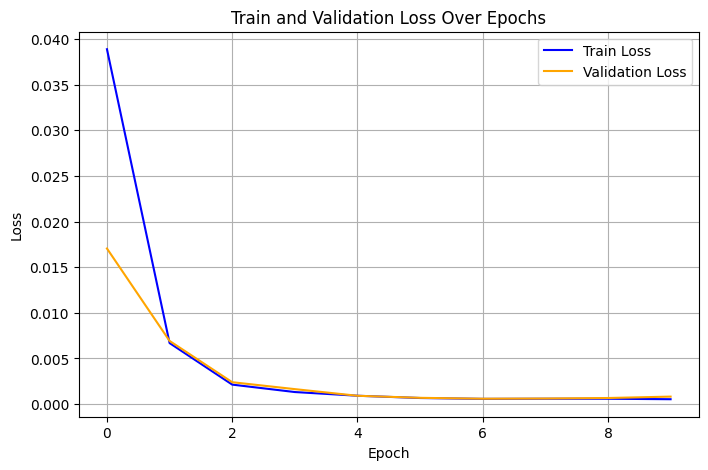

In [27]:
# Tracer la loss 
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

- La loss converge donc on a un nombre d'époques suffisant. Pour tous les apprentissages suivants, nous ajustons le nombre d'époques pour que la loss converge. De plus la loss est proche de zéro autant pour la validation que pour l'entraînement, nous n'avons pas de sur-apprentissage et reconstruisons nos images correctement. 

#### Anomalies 

In [28]:
anomaly_detector_capsule_mae = AnomalyDetectionModel(mask_model_capsule)
anomaly_detector_capsule_mae.to(device) 

anomalie_prediction_capsule_mae, accuracy_capsule_mae = anomaly_detector_capsule_mae.predict(capsule_test_loader)

print('Accuracy prédiction anomalie capsule = ', accuracy_capsule_mae) 

Accuracy prédiction anomalie capsule =  0.6304347826086957


- La précision de la prédiction d'anomalie est de 63%. Ce résultat est peu satisfaisant mais peu surprenant sachant que nous possédons que 66 images au total pour ce jeu de données. 

#### Visualisation 

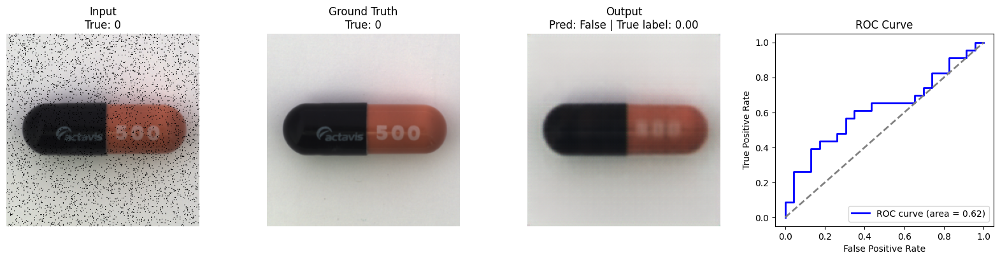

In [34]:
visualize_reconstructions_with_anomalies(mask_model_capsule, anomaly_detector_capsule_mae, capsule_test_loader, device=device, num_images=1)

- On voit ici que la reconstruction est plutôt bonne. Notre encodeur semble fonctionner correctement pour reconstruire l'image. Seule la reconstruction des écritures est plus compliquée. Cela est un problème classique.
- La courbe ROC est proche de la droite x=y pour des seuils plus élevés. Pour ces valeurs le modèle aurait tendance à être peu informatif, avec des performances aléatoires. Pour des valeurs plus faibles , il semble que nous arrivions à prédire de façon plus correcte. 
- Nous obtenons une précision de 63%, ce résultat est cohérent avec la courbe ROC. 

### Bottle images

#### Entrainement

In [ ]:
mask_model_bottle = MaskedAutoencoderModel()

mask_encoder_bottle, train_losses, val_losses = train_ssl_model(mask_model_bottle,
                                     bottle_train_loader, 
                                     bottle_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(mask_model_bottle.parameters(), lr=0.001), 
                                     epochs = 10
                                     )

Epoch 1/10, Train Loss: 0.0434, Val Loss: 0.0132
Epoch 2/10, Train Loss: 0.0069, Val Loss: 0.0073
Epoch 3/10, Train Loss: 0.0034, Val Loss: 0.0039
Epoch 4/10, Train Loss: 0.0027, Val Loss: 0.0033
Epoch 5/10, Train Loss: 0.0023, Val Loss: 0.0031
Epoch 6/10, Train Loss: 0.0019, Val Loss: 0.0025
Epoch 7/10, Train Loss: 0.0016, Val Loss: 0.0023
Epoch 8/10, Train Loss: 0.0016, Val Loss: 0.0023
Epoch 9/10, Train Loss: 0.0015, Val Loss: 0.0021
Epoch 10/10, Train Loss: 0.0014, Val Loss: 0.0022


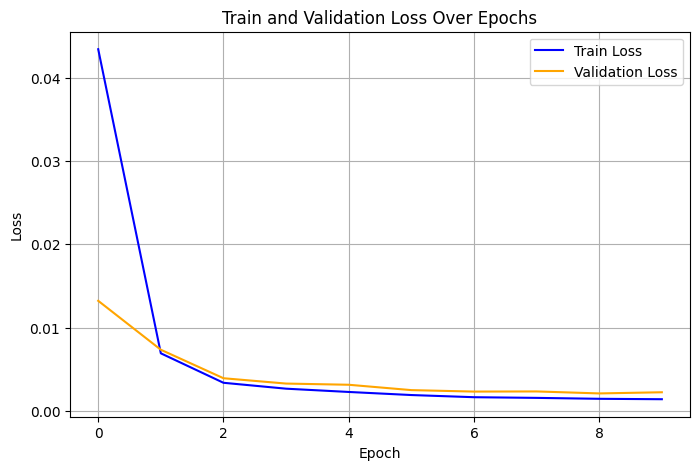

In [36]:
# Tracer la loss 
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [37]:
anomaly_detector_bottle_mae = AnomalyDetectionModel(mask_model_bottle)
anomaly_detector_bottle_mae.to(device) 

anomalie_prediction_bottle_mae , accuracy_bottle_mae = anomaly_detector_bottle_mae.predict(bottle_test_loader)

print('Accuracy prédiction anomalie bottle = ', accuracy_bottle_mae)

Accuracy prédiction anomalie bottle =  0.8


Le modèle semble mieux adapté à la la détéction d'anomalie pour les bouteilles. Nous arrivons à une précision de 80%, ce qui est très satisfaisant. 

#### Visualisation 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.123041965..1.0000002].


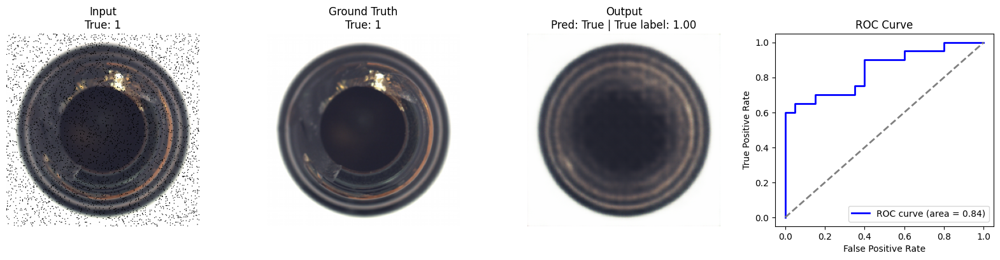

In [38]:
visualize_reconstructions_with_anomalies(mask_model_bottle, anomaly_detector_bottle_mae, bottle_test_loader, device=device, num_images=1)

- La reconstruction de l'image semble manquer de détails. En effet ici, la loss est plus élevée que précédement. Cependant, cela ne semble pas poser problème dans la détection des anomalies. 
- En effet,  l'accuracy de détéction d'anomalie est meilleure. Nous voyons que la courbe ROC est bien suppérieure à la droite x=y. La reconstruction d'images anormales se dinstingue de la reconstruction d'images normales ce qui nous permet de mieux détécter les anomalies.

### Hazelnut images

#### Entraienement 

Epoch 1/10, Train Loss: 0.0184, Val Loss: 0.0042
Epoch 2/10, Train Loss: 0.0017, Val Loss: 0.0018
Epoch 3/10, Train Loss: 0.0011, Val Loss: 0.0017
Epoch 4/10, Train Loss: 0.0009, Val Loss: 0.0013
Epoch 5/10, Train Loss: 0.0008, Val Loss: 0.0012
Epoch 6/10, Train Loss: 0.0008, Val Loss: 0.0010
Epoch 7/10, Train Loss: 0.0007, Val Loss: 0.0015
Epoch 8/10, Train Loss: 0.0007, Val Loss: 0.0010
Epoch 9/10, Train Loss: 0.0006, Val Loss: 0.0009
Epoch 10/10, Train Loss: 0.0006, Val Loss: 0.0009


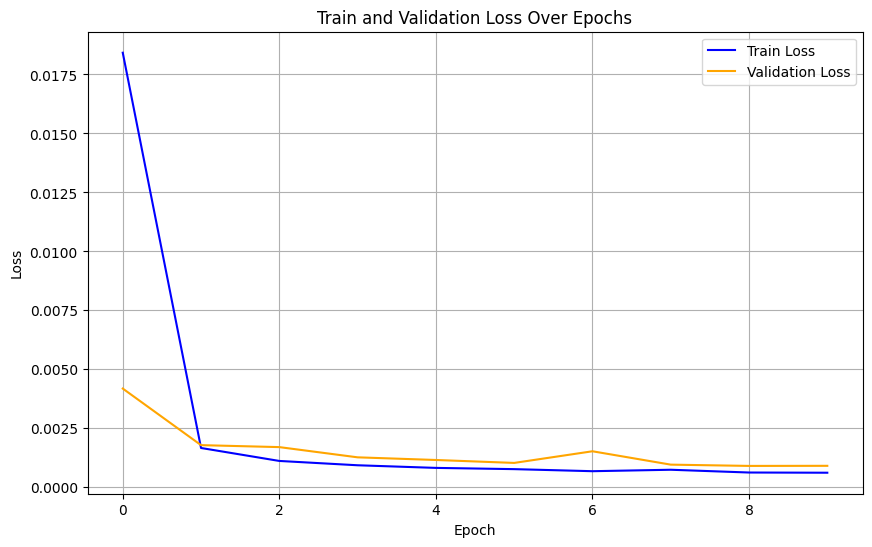

In [ ]:
mask_model_hazelnut = MaskedAutoencoderModel()

mask_encoder_hazelnut,train_losses, val_losses = train_ssl_model(mask_model_hazelnut,
                                     hazelnut_train_loader, 
                                     hazelnut_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(mask_model_hazelnut.parameters(), lr=0.001)
                                     )


# Tracer la loss 
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [41]:
anomaly_detector_hazelnut_mae = AnomalyDetectionModel(mask_model_hazelnut)
anomaly_detector_hazelnut_mae.to(device) 

anomalie_prediction_hazelnut_mae , accuracy_hazelnut_mae = anomaly_detector_hazelnut_mae.predict(hazelnut_test_loader)

print('Accuracy prédiction anomalie hazelnut = ', accuracy_hazelnut_mae)

Accuracy prédiction anomalie hazelnut =  0.7625


#### Visualisation

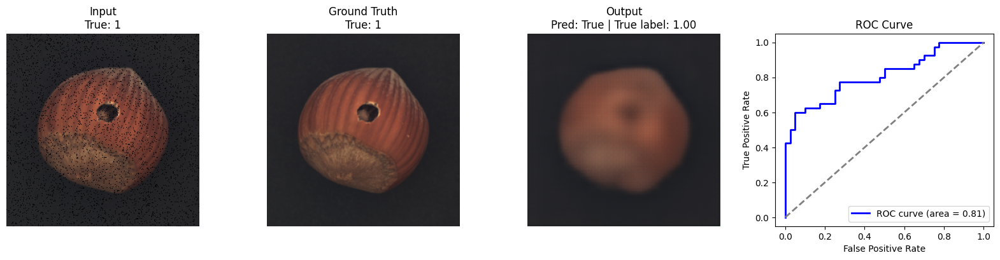

In [42]:
visualize_reconstructions_with_anomalies(mask_model_hazelnut, anomaly_detector_hazelnut_mae, hazelnut_test_loader, device=device, num_images=1)

- On peut remarquer ici que le modèle reconstruit en partie l'anomalie malgrè l'apprentissage sur des données normales. Cependant la reconstruction de cette partie est quand même moins bonne que pour une image sans anomalie. En effet notre courbe ROC montre bien que le modèle parvient à différencier correctement les images normales des images anormales.
- La précision est ici de 76%, la courbe ROC est correcte : le modèle est satisfaisant.

### Toothbrush images 

#### Entraînement 

Epoch 1/10, Train Loss: 0.0792, Val Loss: 0.1289
Epoch 2/10, Train Loss: 0.0174, Val Loss: 0.0232
Epoch 3/10, Train Loss: 0.0108, Val Loss: 0.0114
Epoch 4/10, Train Loss: 0.0094, Val Loss: 0.0088
Epoch 5/10, Train Loss: 0.0087, Val Loss: 0.0084
Epoch 6/10, Train Loss: 0.0078, Val Loss: 0.0082
Epoch 7/10, Train Loss: 0.0069, Val Loss: 0.0084
Epoch 8/10, Train Loss: 0.0059, Val Loss: 0.0084
Epoch 9/10, Train Loss: 0.0051, Val Loss: 0.0105
Epoch 10/10, Train Loss: 0.0044, Val Loss: 0.0070


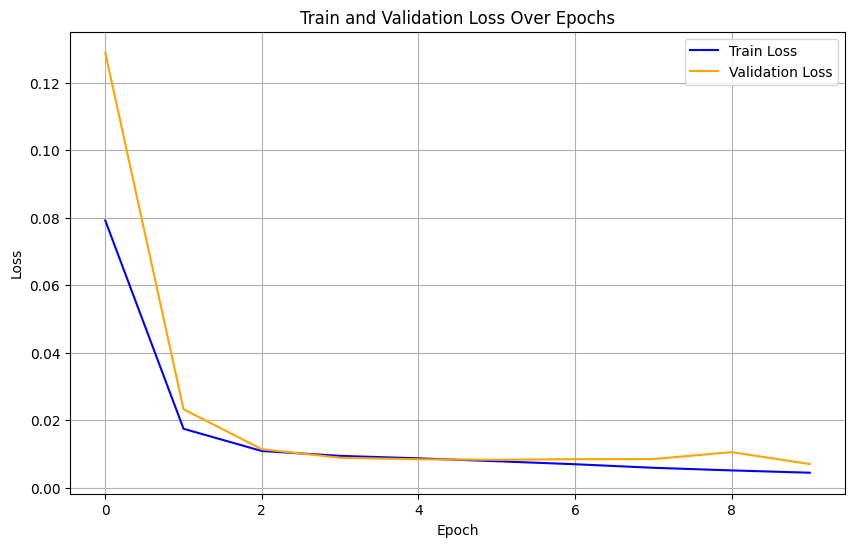

In [ ]:
mask_model_toothbrush = MaskedAutoencoderModel()

mask_encoder_toothbrush, train_losses, val_losses = train_ssl_model(mask_model_toothbrush,
                                     toothbrush_train_loader, 
                                     toothbrush_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(mask_model_toothbrush.parameters(), lr=0.001)
                                     )


# Tracer la loss 
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalie 

In [44]:
anomaly_detector_toothbrush_mae = AnomalyDetectionModel(mask_model_toothbrush)
anomaly_detector_toothbrush_mae.to(device) 

anomalie_prediction_toothbrush_mae, accuracy_toothbrush_mae = anomaly_detector_toothbrush_mae.predict(toothbrush_test_loader)

print('Accuracy prédiction anomalie toothbrush = ', accuracy_toothbrush_mae)

Accuracy prédiction anomalie toothbrush =  0.6666666666666666


#### Visualisation

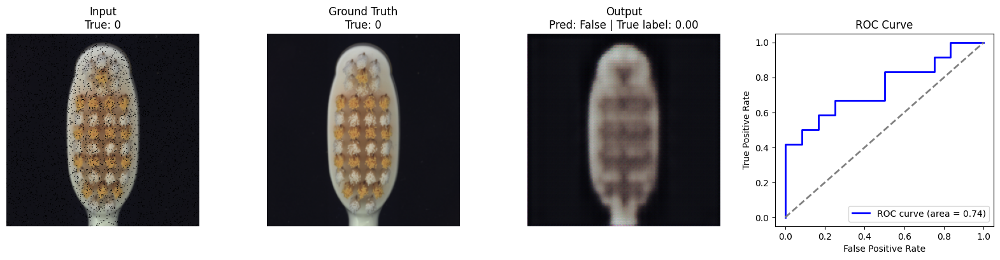

In [45]:
visualize_reconstructions_with_anomalies(mask_model_toothbrush, anomaly_detector_toothbrush_mae, toothbrush_test_loader, device=device, num_images=1)

- La reconstruction de l'image semble avoir des difficultés à reproduire les détails fins des poils de la brosse à dents. La loss est plus élevée que pour les jeux de données précédents. 
- L'accuracy est de 66%, la courbe ROC est 'correcte'.

### Engine wiring images

#### Entrainement 

Epoch 1/15, Train Loss: 0.0413, Val Loss: 0.0269
Epoch 2/15, Train Loss: 0.0201, Val Loss: 0.0189
Epoch 3/15, Train Loss: 0.0149, Val Loss: 0.0156
Epoch 4/15, Train Loss: 0.0110, Val Loss: 0.0109
Epoch 5/15, Train Loss: 0.0093, Val Loss: 0.0089
Epoch 6/15, Train Loss: 0.0079, Val Loss: 0.0085
Epoch 7/15, Train Loss: 0.0070, Val Loss: 0.0067
Epoch 8/15, Train Loss: 0.0063, Val Loss: 0.0061
Epoch 9/15, Train Loss: 0.0058, Val Loss: 0.0059
Epoch 10/15, Train Loss: 0.0053, Val Loss: 0.0055
Epoch 11/15, Train Loss: 0.0050, Val Loss: 0.0049
Epoch 12/15, Train Loss: 0.0046, Val Loss: 0.0047
Epoch 13/15, Train Loss: 0.0042, Val Loss: 0.0043
Epoch 14/15, Train Loss: 0.0041, Val Loss: 0.0042
Epoch 15/15, Train Loss: 0.0039, Val Loss: 0.0041


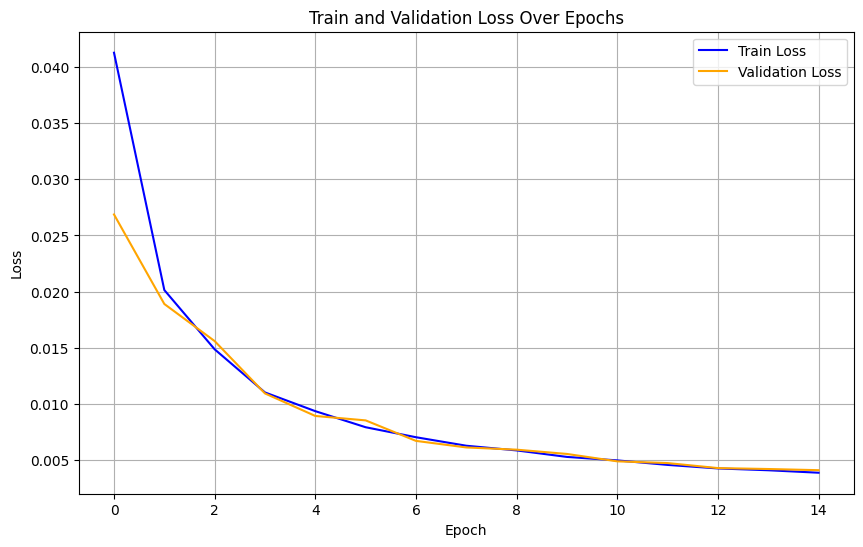

In [ ]:
mask_model_engine = MaskedAutoencoderModel()

mask_encoder_engine,train_losses, val_losses  = train_ssl_model(mask_model_engine,
                                     engine_train_loader, 
                                     engine_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(mask_model_engine.parameters(), lr=0.001), 
                                     epochs = 15
                                     )

# Tracer la loss 
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

- La loss converge moins rapidement dans ce cas,  nous avons donc augmenté le nombre d'époques à 15. 

#### Anomalies

In [47]:
anomaly_detector_engine_mae = AnomalyDetectionModel(mask_model_engine)
anomaly_detector_engine_mae.to(device) 

anomalie_prediction_engine_mae,accuracy_engine_mae = anomaly_detector_engine_mae.predict(engine_test_loader)

print('Accuracy prédiction anomalie engine = ', accuracy_engine_mae)

Accuracy prédiction anomalie engine =  0.6526315789473685


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.035865147..1.0000002].


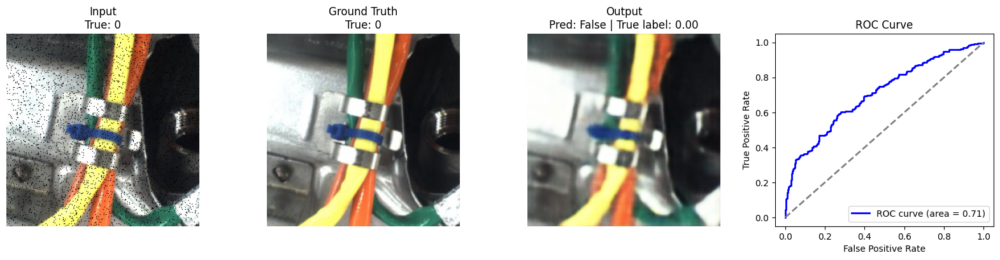

In [48]:
visualize_reconstructions_with_anomalies(mask_model_engine, anomaly_detector_engine_mae, engine_test_loader, device=device, num_images=1)

- Nous avons beacoup plus d'images pour ce jeu de données, la courbe ROC est donc plus lisse. Le résultat de 65% de précision devrait être plus consistant sur différentes compilations. 

## Inpainting Model

Nous dégradons ici les images à l'aide d'un masque. On met à zéro un groupe de pixels voisins. Le modèle apprend à reconstruire l'image et sa partie manquante. On définit la taille du masque mais sa position sur l'image est aléatoire. Contrairement au Masked Encoder Model, où les pixels sont masqués aléatoirement et de manière dispersée, ici, les zones masquées forment des blocs contigus. Cela reflète davantage des cas réels, comme des objets manquants ou des parties endommagées d'une image. Le modèle apprend à reconstruire l'image complète, y compris les zones masquées, en inférant les informations manquantes à partir des parties visibles. La position des masques est aléatoire, mais leur taille est contrôlée par un hyperparamètre clé.

- L'hyperparamètre à choisir ici est donc la taille du masque. Si le masque est petit, le modèle peut utiliser des informations locales pour reconstruire les zones manquantes et donc ne pas apprendre suffisamment. Quand le masque est grand, la reconstruction devient plus complexe, car le modèle doit s'appuyer sur des structures globales ou des relations à grande échelle entre différentes parties de l'image.

![Texte alternatif](./inpainting.png)

In [ ]:
class InpaintingModel(nn.Module):
    def __init__(self, mask_size,latent_dim=128):
        super(InpaintingModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x) 
        z = self.encoder(x_masked) 
        return self.decoder(z), x_masked 
    
    def apply_mask(self, x):
        masked_x = x.clone()
        for i in range(masked_x.size(0)):
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x+self.mask_size, ul_y:ul_y+self.mask_size] = 0

        return masked_x

### Capsules images

#### Training 

Epoch 1/10, Train Loss: 0.0227, Val Loss: 0.0874
Epoch 2/10, Train Loss: 0.0053, Val Loss: 0.0062
Epoch 3/10, Train Loss: 0.0029, Val Loss: 0.0050
Epoch 4/10, Train Loss: 0.0020, Val Loss: 0.0020
Epoch 5/10, Train Loss: 0.0014, Val Loss: 0.0023
Epoch 6/10, Train Loss: 0.0012, Val Loss: 0.0014
Epoch 7/10, Train Loss: 0.0009, Val Loss: 0.0011
Epoch 8/10, Train Loss: 0.0008, Val Loss: 0.0010
Epoch 9/10, Train Loss: 0.0007, Val Loss: 0.0008
Epoch 10/10, Train Loss: 0.0007, Val Loss: 0.0011


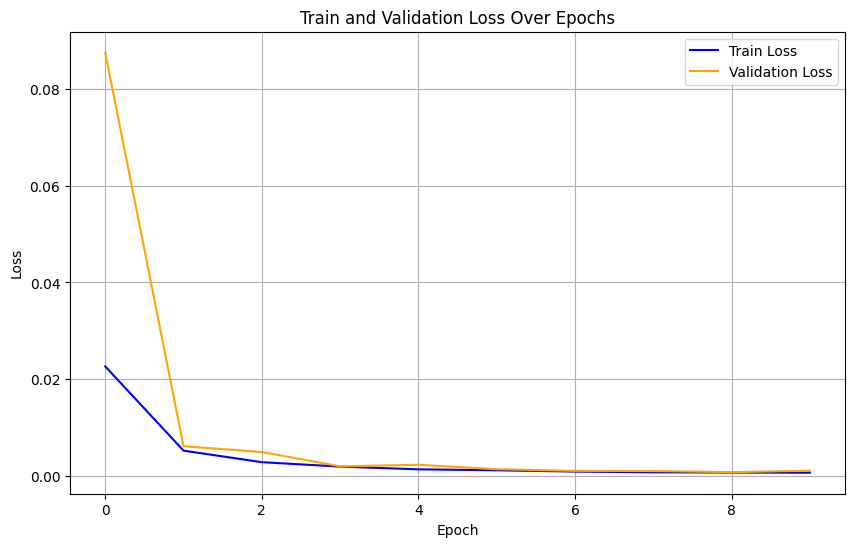

In [ ]:
inpainting_model_capsule = InpaintingModel(mask_size=64)

 
inpainting_encoder_capsule, train_losses, val_losses = train_ssl_model(inpainting_model_capsule,
                                     capsule_train_loader, 
                                     capsule_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(inpainting_model_capsule.parameters(), lr=0.001)
                                     )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalie

In [52]:
anomaly_detector_capsule_inp = AnomalyDetectionModel(inpainting_model_capsule)
anomaly_detector_capsule_inp.to(device) 

anomalie_prediction_capsule_inp, accuracy_capsule_inp = anomaly_detector_capsule_inp.predict(capsule_test_loader)

print('Accuracy prédiction anomalie capsule = ', accuracy_capsule_inp)

Accuracy prédiction anomalie capsule =  0.6521739130434783


#### Visualisation

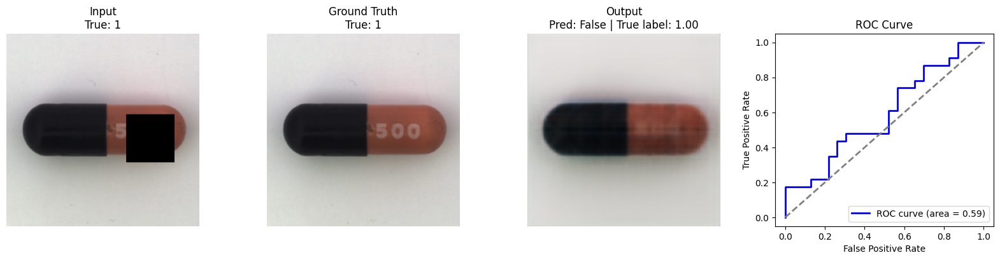

In [53]:
visualize_reconstructions_with_anomalies(inpainting_model_capsule, anomaly_detector_capsule_inp, capsule_test_loader, device=device, num_images=1)

### Bottle images

#### Training 

Epoch 1/10, Train Loss: 0.0377, Val Loss: 0.0556
Epoch 2/10, Train Loss: 0.0067, Val Loss: 0.0095
Epoch 3/10, Train Loss: 0.0047, Val Loss: 0.0070
Epoch 4/10, Train Loss: 0.0041, Val Loss: 0.0053
Epoch 5/10, Train Loss: 0.0038, Val Loss: 0.0105
Epoch 6/10, Train Loss: 0.0033, Val Loss: 0.0060
Epoch 7/10, Train Loss: 0.0030, Val Loss: 0.0050
Epoch 8/10, Train Loss: 0.0027, Val Loss: 0.0042
Epoch 9/10, Train Loss: 0.0024, Val Loss: 0.0042
Epoch 10/10, Train Loss: 0.0023, Val Loss: 0.0038


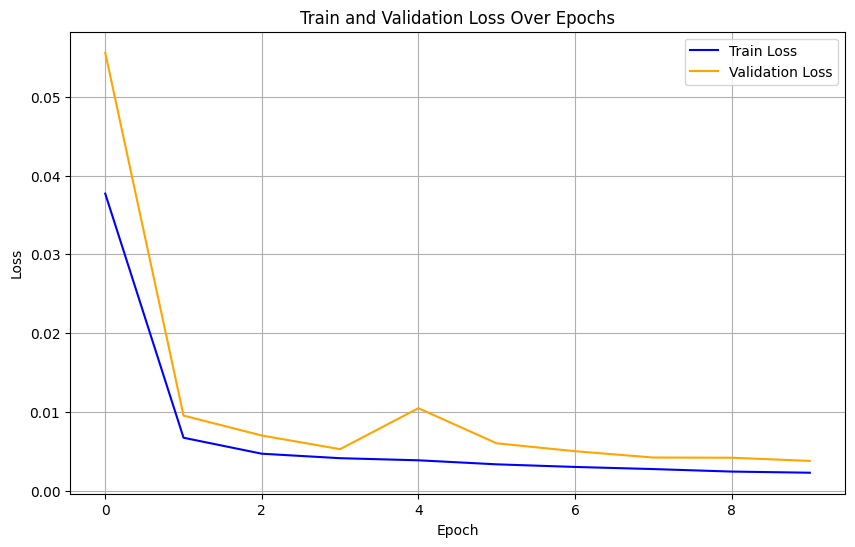

In [ ]:
inpainting_model_bottle = InpaintingModel(mask_size=64)

inpainting_encoder_bottle,  train_losses, val_losses = train_ssl_model(inpainting_model_bottle,
                                     bottle_train_loader, 
                                     bottle_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(inpainting_model_bottle.parameters(), lr=0.001)
                                     )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalie

In [55]:
anomaly_detector_bottle_inp = AnomalyDetectionModel(inpainting_model_bottle)
anomaly_detector_bottle_inp.to(device) 

anomalie_prediction_bottle_inp , accuracy_bottle_inp= anomaly_detector_bottle_inp.predict(bottle_test_loader)

print('Accuracy prédiction anomalie bottle = ', accuracy_bottle_inp)

Accuracy prédiction anomalie bottle =  0.775


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.123103246..1.0000002].


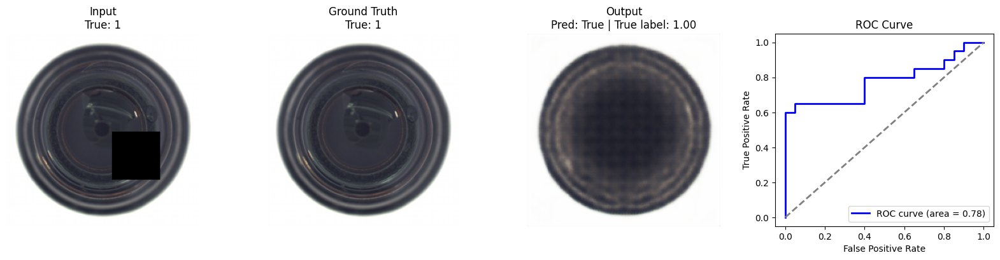

In [56]:
visualize_reconstructions_with_anomalies(inpainting_model_bottle, anomaly_detector_bottle_inp, bottle_test_loader, device=device, num_images=1)

### Hazelnut images

#### Entrainement 

Epoch 1/10, Train Loss: 0.0605, Val Loss: 0.0257
Epoch 2/10, Train Loss: 0.0239, Val Loss: 0.0157
Epoch 3/10, Train Loss: 0.0120, Val Loss: 0.0074
Epoch 4/10, Train Loss: 0.0061, Val Loss: 0.0036
Epoch 5/10, Train Loss: 0.0035, Val Loss: 0.0051
Epoch 6/10, Train Loss: 0.0023, Val Loss: 0.0022
Epoch 7/10, Train Loss: 0.0017, Val Loss: 0.0018
Epoch 8/10, Train Loss: 0.0014, Val Loss: 0.0028
Epoch 9/10, Train Loss: 0.0012, Val Loss: 0.0014
Epoch 10/10, Train Loss: 0.0011, Val Loss: 0.0017


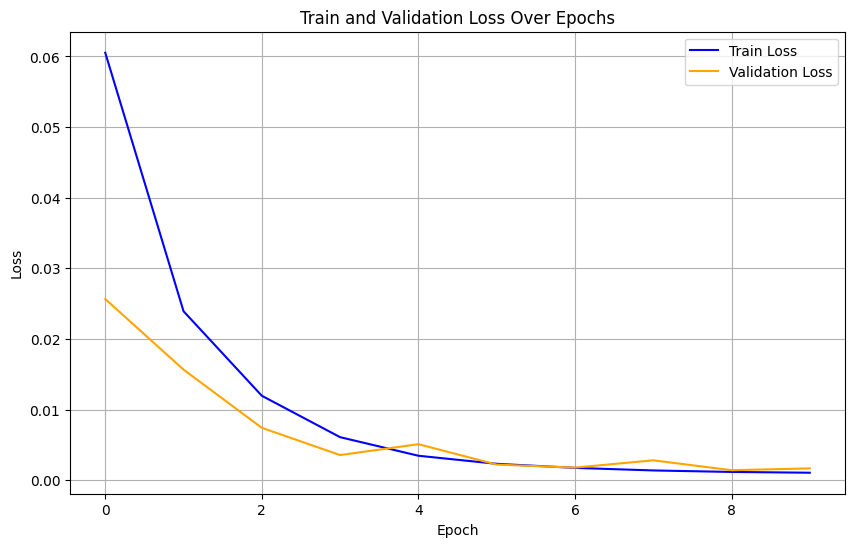

In [ ]:
inpainting_model_hazelnut = InpaintingModel(mask_size=64)

inpainting_encoder_hazelnut, train_losses, val_losses = train_ssl_model(inpainting_model_hazelnut,
                                     hazelnut_train_loader, 
                                     hazelnut_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(inpainting_model_hazelnut.parameters(), lr=0.0001)
                                     )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalie

In [58]:
anomaly_detector_hazelnut_inp = AnomalyDetectionModel(inpainting_model_hazelnut)
anomaly_detector_hazelnut_inp.to(device) 

anomalie_prediction_hazelnut_inp,accuracy_hazelnut_inp = anomaly_detector_hazelnut_inp.predict(hazelnut_test_loader)

print('Accuracy prédiction anomalie hazelnut = ', accuracy_hazelnut_inp)

Accuracy prédiction anomalie hazelnut =  0.7375


#### Visualisation

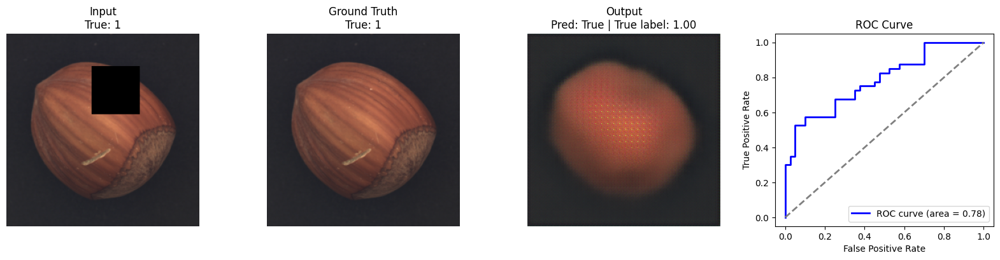

In [59]:
visualize_reconstructions_with_anomalies(inpainting_model_hazelnut, anomaly_detector_hazelnut_inp, hazelnut_test_loader, device=device, num_images=1)

### Toothbrush images 

#### Entraînement 

Epoch 1/15, Train Loss: 0.1375, Val Loss: 0.1302
Epoch 2/15, Train Loss: 0.0947, Val Loss: 0.1038
Epoch 3/15, Train Loss: 0.0770, Val Loss: 0.0771
Epoch 4/15, Train Loss: 0.0652, Val Loss: 0.0619
Epoch 5/15, Train Loss: 0.0565, Val Loss: 0.0522
Epoch 6/15, Train Loss: 0.0489, Val Loss: 0.0410
Epoch 7/15, Train Loss: 0.0427, Val Loss: 0.0329
Epoch 8/15, Train Loss: 0.0370, Val Loss: 0.0285
Epoch 9/15, Train Loss: 0.0321, Val Loss: 0.0255
Epoch 10/15, Train Loss: 0.0278, Val Loss: 0.0230
Epoch 11/15, Train Loss: 0.0244, Val Loss: 0.0206
Epoch 12/15, Train Loss: 0.0214, Val Loss: 0.0187
Epoch 13/15, Train Loss: 0.0189, Val Loss: 0.0171
Epoch 14/15, Train Loss: 0.0168, Val Loss: 0.0150
Epoch 15/15, Train Loss: 0.0148, Val Loss: 0.0136


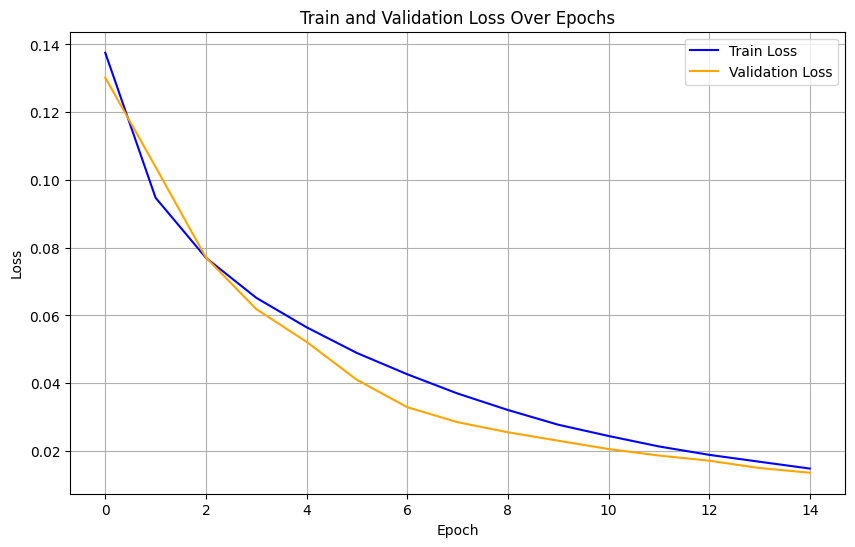

In [ ]:
inpainting_model_toothbrush = InpaintingModel(mask_size=64)

inpainting_encoder_toothbrush, train_losses, val_losses = train_ssl_model(inpainting_model_toothbrush,
                                     toothbrush_train_loader, 
                                     toothbrush_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(inpainting_model_toothbrush.parameters(), lr=0.0001), 
                                     epochs = 15
                                     )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalie

In [61]:
anomaly_detector_toothbrush_inp = AnomalyDetectionModel(inpainting_model_toothbrush)
anomaly_detector_toothbrush_inp.to(device) 

anomalie_prediction_toothbrush_inp, accuracy_toothbrush_inp = anomaly_detector_toothbrush_inp.predict(toothbrush_test_loader)

print('Accuracy prédiction anomalie toothbrush = ', accuracy_toothbrush_inp)

Accuracy prédiction anomalie toothbrush =  0.5


#### Visualisation

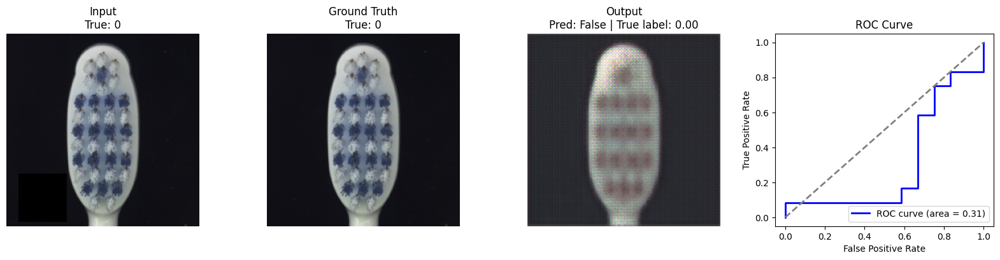

In [62]:
visualize_reconstructions_with_anomalies(inpainting_model_toothbrush, anomaly_detector_toothbrush_inp, toothbrush_test_loader, device=device, num_images=1)

- Le résultat ici est très mauvais, une prédiction aléatoire donnerait un résultat semblable, il ne semble pas que la dégradation inpainting parvienne à notre auto-encodeur à reconstruire l'image suffisamment correctement pour que les anomalies soient détéctées. 

### Engine wiring images

#### Entrainement 

Epoch 1/10, Train Loss: 0.0679, Val Loss: 0.0590
Epoch 2/10, Train Loss: 0.0270, Val Loss: 0.0213
Epoch 3/10, Train Loss: 0.0174, Val Loss: 0.0151
Epoch 4/10, Train Loss: 0.0134, Val Loss: 0.0131
Epoch 5/10, Train Loss: 0.0116, Val Loss: 0.0107
Epoch 6/10, Train Loss: 0.0100, Val Loss: 0.0100
Epoch 7/10, Train Loss: 0.0092, Val Loss: 0.0106
Epoch 8/10, Train Loss: 0.0086, Val Loss: 0.0095
Epoch 9/10, Train Loss: 0.0080, Val Loss: 0.0078
Epoch 10/10, Train Loss: 0.0074, Val Loss: 0.0073


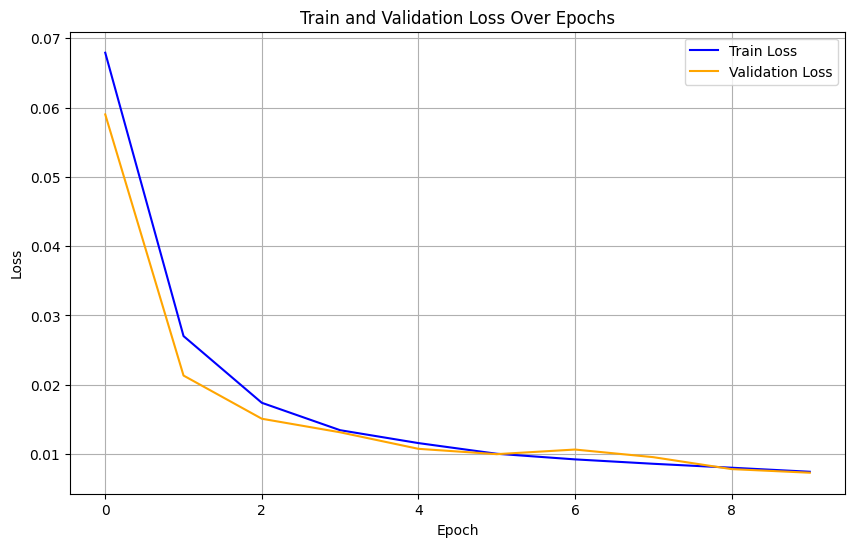

In [ ]:
inpainting_model_engine = InpaintingModel(mask_size=64)

inpainting_encoder_engine ,train_losses, val_losses= train_ssl_model(inpainting_model_engine,
                                     engine_train_loader, 
                                     engine_test_loader, 
                                     criterion=nn.MSELoss(), 
                                     optimizer=optim.Adam(inpainting_model_engine.parameters(), lr=0.0001)
                                     )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [64]:
anomaly_detector_engine_inp = AnomalyDetectionModel(inpainting_model_engine)
anomaly_detector_engine_inp.to(device) 

anomalie_prediction_engine_inp, accuracy_engine_inp = anomaly_detector_engine_inp.predict(engine_test_loader)

print('Accuracy prédiction anomalie engine = ', accuracy_engine_inp)

Accuracy prédiction anomalie engine =  0.5807017543859649


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03744657..1.0000002].


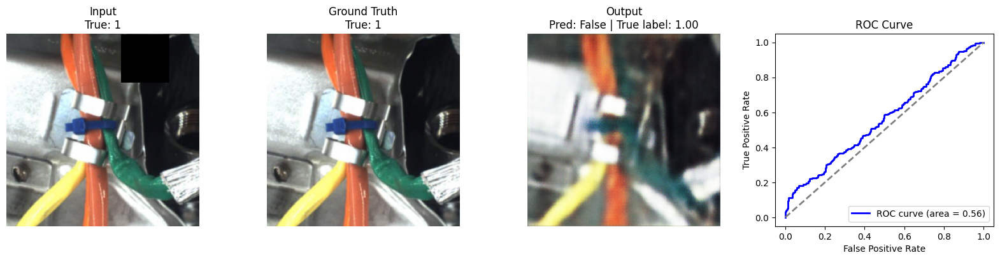

In [65]:
visualize_reconstructions_with_anomalies(inpainting_model_engine, anomaly_detector_engine_inp, engine_test_loader, device=device, num_images=1)

- Le résultat est mauvais, il est semblable à celui d'une prédiction aléatoire. 

## Colorization 

Ici nous dégradons notre image en la mettant en noir et blanc. L'objectif est de reconstruire les couleurs originales de l'image à partir de cette version en niveaux de gris. Ce problème oblige le modèle à apprendre des relations locales,et aussi des contextes globaux pour prédire les couleurs plausibles dans différentes parties de l'image.

- Il n'y a pas d'hyperparamètre particulier pour ce modèle. 

![Texte alternatif](./colorizing.png)

In [ ]:
class ColorizationModel(nn.Module):
    def __init__(self, latent_dim=128):
        super(ColorizationModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim, in_channels=1)  # Input en noir et blanc
        self.decoder = Decoder(latent_dim=latent_dim, out_channels=3)  # Prediction de RGB

    def forward(self, x):
        grayscale_x = transforms.Grayscale()(x)  # Convertire RGB à noir et blanc
        z = self.encoder(grayscale_x)
        return self.decoder(z), grayscale_x


### Capsule

#### Entrainement 

Epoch 1/10, Train Loss: 0.0533, Val Loss: 0.0479
Epoch 2/10, Train Loss: 0.0213, Val Loss: 0.0128
Epoch 3/10, Train Loss: 0.0106, Val Loss: 0.0068
Epoch 4/10, Train Loss: 0.0058, Val Loss: 0.0040
Epoch 5/10, Train Loss: 0.0037, Val Loss: 0.0029
Epoch 6/10, Train Loss: 0.0025, Val Loss: 0.0021
Epoch 7/10, Train Loss: 0.0018, Val Loss: 0.0015
Epoch 8/10, Train Loss: 0.0014, Val Loss: 0.0013
Epoch 9/10, Train Loss: 0.0011, Val Loss: 0.0010
Epoch 10/10, Train Loss: 0.0009, Val Loss: 0.0008


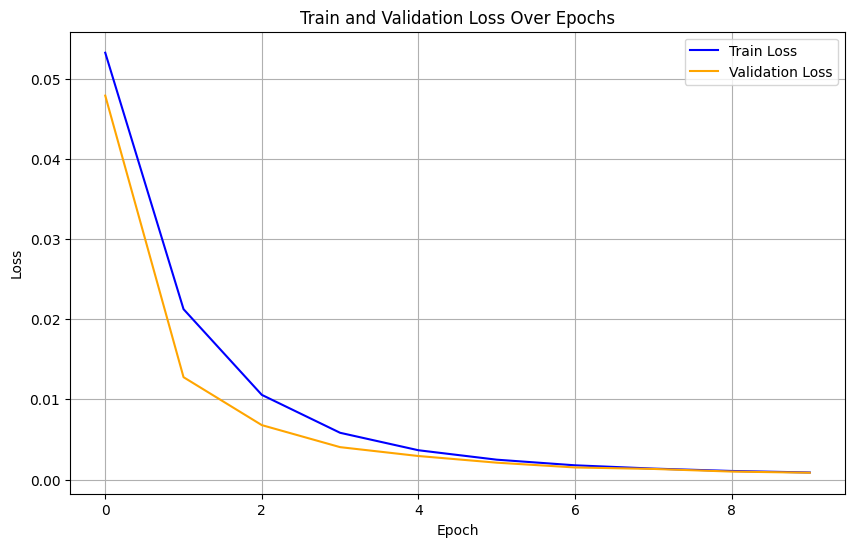

In [ ]:
colorization_model_capsule = ColorizationModel(latent_dim=128)

colorization_encoder_capsule,train_losses, val_losses = train_ssl_model(colorization_model_capsule, 
                                       capsule_train_loader, 
                                       capsule_test_loader, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_capsule.parameters(), lr=0.0001)
                                       )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [68]:
anomaly_detector_capsule_col = AnomalyDetectionModel(colorization_model_capsule)
anomaly_detector_capsule_col.to(device) 

anomalie_prediction_capsule_col, accuracy_capsule_col = anomaly_detector_capsule_col.predict(capsule_test_loader)

print('Accuracy prédiction anomalie capsule = ', accuracy_capsule_col)

Accuracy prédiction anomalie capsule =  0.6086956521739131


#### Visualisation

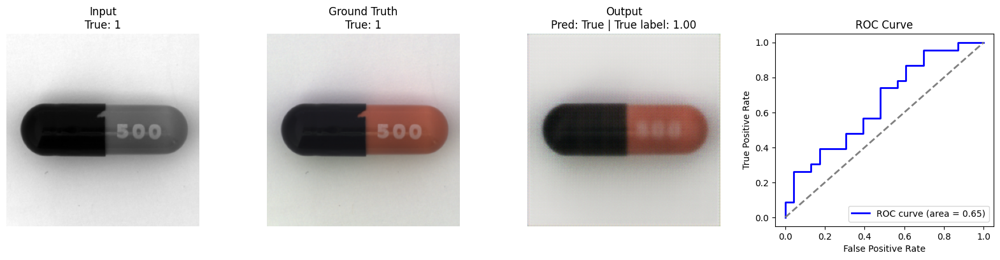

In [69]:
visualize_reconstructions_with_anomalies(colorization_model_capsule, anomaly_detector_capsule_col, capsule_test_loader, device=device, num_images=1)

### Bottle

#### Entrainement 

Epoch 1/10, Train Loss: 0.0640, Val Loss: 0.1290
Epoch 2/10, Train Loss: 0.0173, Val Loss: 0.0161
Epoch 3/10, Train Loss: 0.0094, Val Loss: 0.0096
Epoch 4/10, Train Loss: 0.0062, Val Loss: 0.0068
Epoch 5/10, Train Loss: 0.0045, Val Loss: 0.0046
Epoch 6/10, Train Loss: 0.0035, Val Loss: 0.0038
Epoch 7/10, Train Loss: 0.0028, Val Loss: 0.0032
Epoch 8/10, Train Loss: 0.0024, Val Loss: 0.0027
Epoch 9/10, Train Loss: 0.0021, Val Loss: 0.0027
Epoch 10/10, Train Loss: 0.0019, Val Loss: 0.0023


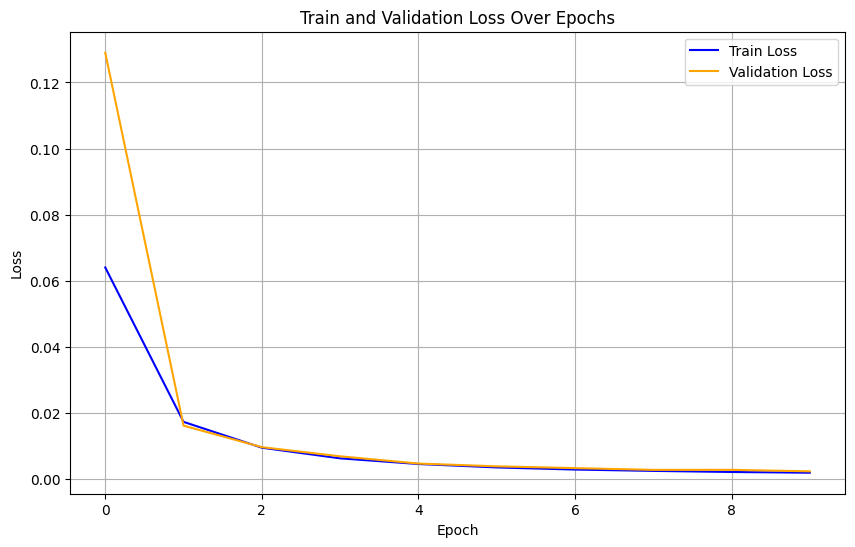

In [ ]:
colorization_model_bottle = ColorizationModel(latent_dim=128)

colorization_encoder_bottle, train_losses, val_losses = train_ssl_model(colorization_model_bottle, 
                                       bottle_train_loader, 
                                       bottle_test_loader, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_bottle.parameters(), lr=0.0001)
                                       )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


#### Anomalies

In [71]:
anomaly_detector_bottle_col = AnomalyDetectionModel(colorization_model_bottle)
anomaly_detector_bottle_col.to(device) 

anomalie_prediction_bottle_col, accuracy_bottle_col = anomaly_detector_bottle_col.predict(bottle_test_loader)

print('Accuracy prédiction anomalie bottle = ', accuracy_bottle_col)

Accuracy prédiction anomalie bottle =  0.775


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.119746484..1.0000002].


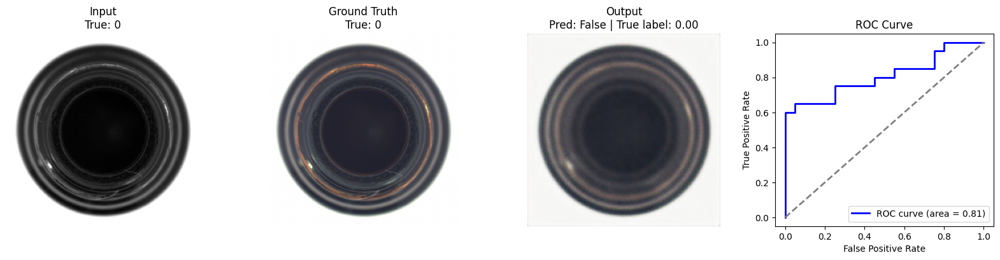

In [72]:
visualize_reconstructions_with_anomalies(colorization_model_bottle, anomaly_detector_bottle_col, bottle_test_loader, device=device, num_images=1)

### Hazelnut

#### Entrainement 

Epoch 1/10, Train Loss: 0.0855, Val Loss: 0.0410
Epoch 2/10, Train Loss: 0.0411, Val Loss: 0.0265
Epoch 3/10, Train Loss: 0.0215, Val Loss: 0.0126
Epoch 4/10, Train Loss: 0.0096, Val Loss: 0.0047
Epoch 5/10, Train Loss: 0.0037, Val Loss: 0.0022
Epoch 6/10, Train Loss: 0.0017, Val Loss: 0.0021
Epoch 7/10, Train Loss: 0.0011, Val Loss: 0.0013
Epoch 8/10, Train Loss: 0.0009, Val Loss: 0.0012
Epoch 9/10, Train Loss: 0.0008, Val Loss: 0.0013
Epoch 10/10, Train Loss: 0.0008, Val Loss: 0.0011


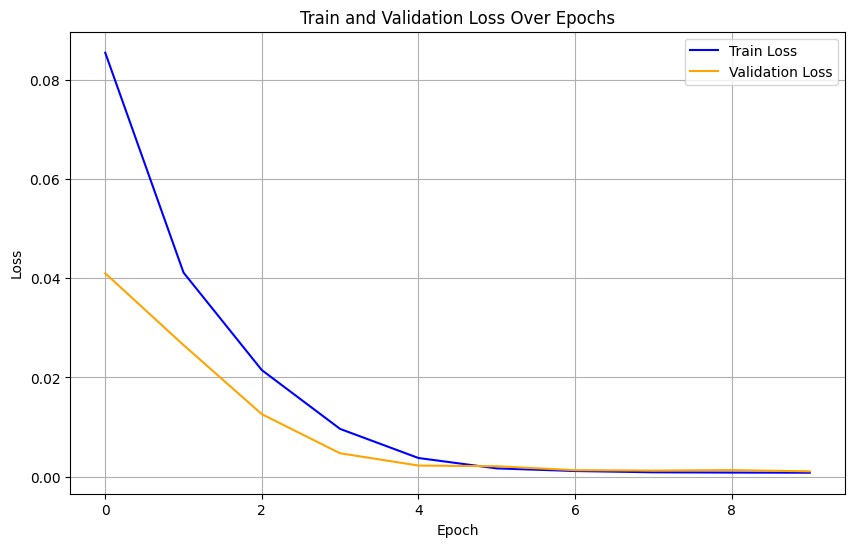

In [ ]:
colorization_model_hazelnut = ColorizationModel(latent_dim=128)

colorization_encoder_hazelnut, train_losses, val_losses = train_ssl_model(colorization_model_hazelnut, 
                                       hazelnut_train_loader, 
                                       hazelnut_test_loader, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_hazelnut.parameters(), lr=0.0001)
                                       )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


#### Anomalies

In [74]:
anomaly_detector_hazelnut_col = AnomalyDetectionModel(colorization_model_hazelnut)
anomaly_detector_hazelnut_col.to(device) 

anomalie_prediction_hazelnut_col, accuracy_hazelnut_col= anomaly_detector_hazelnut_col.predict(hazelnut_test_loader)

print('Accuracy prédiction anomalie hazelnut = ', accuracy_hazelnut_col)

Accuracy prédiction anomalie hazelnut =  0.75


#### Visualisation

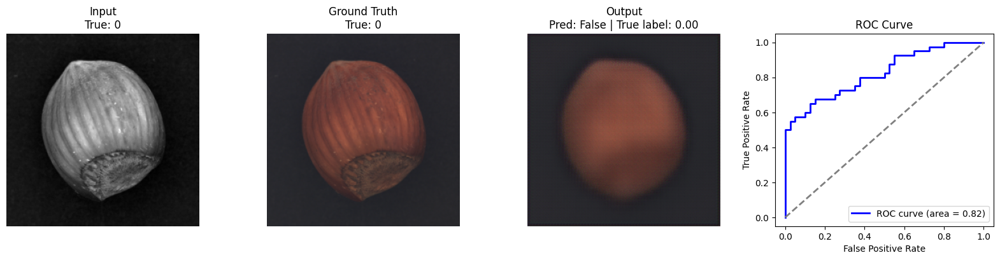

In [75]:
visualize_reconstructions_with_anomalies(colorization_model_hazelnut, anomaly_detector_hazelnut_col, hazelnut_test_loader, device=device, num_images=1)

### Toothbrush

#### Entraînement 

Epoch 1/20, Train Loss: 0.1321, Val Loss: 0.1218
Epoch 2/20, Train Loss: 0.0932, Val Loss: 0.0984
Epoch 3/20, Train Loss: 0.0777, Val Loss: 0.0768
Epoch 4/20, Train Loss: 0.0675, Val Loss: 0.0601
Epoch 5/20, Train Loss: 0.0590, Val Loss: 0.0530
Epoch 6/20, Train Loss: 0.0519, Val Loss: 0.0473
Epoch 7/20, Train Loss: 0.0461, Val Loss: 0.0416
Epoch 8/20, Train Loss: 0.0406, Val Loss: 0.0370
Epoch 9/20, Train Loss: 0.0361, Val Loss: 0.0324
Epoch 10/20, Train Loss: 0.0321, Val Loss: 0.0286
Epoch 11/20, Train Loss: 0.0285, Val Loss: 0.0254
Epoch 12/20, Train Loss: 0.0254, Val Loss: 0.0228
Epoch 13/20, Train Loss: 0.0228, Val Loss: 0.0207
Epoch 14/20, Train Loss: 0.0204, Val Loss: 0.0186
Epoch 15/20, Train Loss: 0.0183, Val Loss: 0.0167
Epoch 16/20, Train Loss: 0.0163, Val Loss: 0.0150
Epoch 17/20, Train Loss: 0.0146, Val Loss: 0.0139
Epoch 18/20, Train Loss: 0.0133, Val Loss: 0.0124
Epoch 19/20, Train Loss: 0.0120, Val Loss: 0.0112
Epoch 20/20, Train Loss: 0.0109, Val Loss: 0.0106


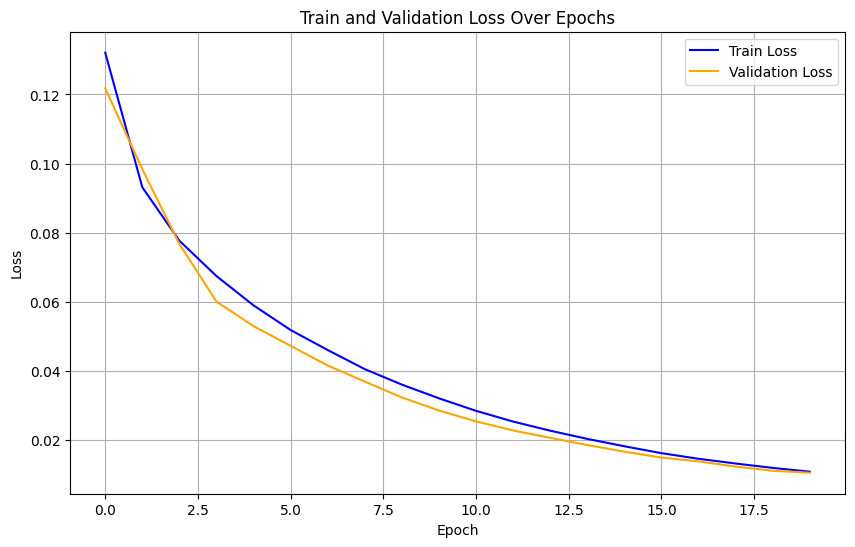

In [ ]:
colorization_model_toothbrush = ColorizationModel(latent_dim=128)

colorization_encoder_toothbrush, train_losses, val_losses = train_ssl_model(colorization_model_toothbrush, 
                                       toothbrush_train_loader, 
                                       toothbrush_test_loader, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_toothbrush.parameters(), lr=0.0001), 
                                                                            epochs = 20
                                       )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


#### Anomalies 

In [77]:
anomaly_detector_toothbrush_col = AnomalyDetectionModel(colorization_model_toothbrush)
anomaly_detector_toothbrush_col.to(device) 

anomalie_prediction_toothbrush_col, accuracy_toothbrush_col = anomaly_detector_toothbrush_col.predict(toothbrush_test_loader)

print('Accuracy prédiction anomalie toothbrush = ', accuracy_toothbrush_col)

Accuracy prédiction anomalie toothbrush =  0.5


#### Visualisation

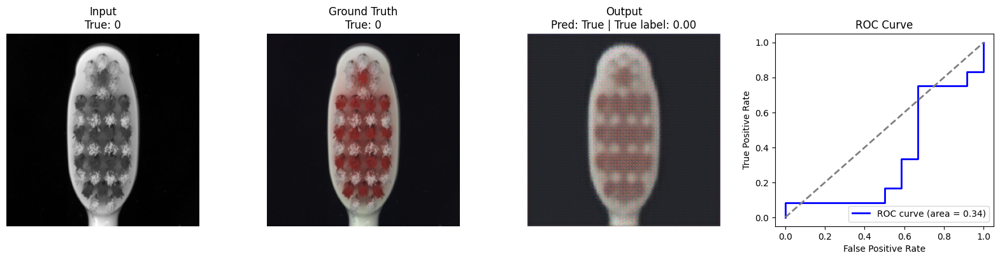

In [78]:
visualize_reconstructions_with_anomalies(colorization_model_toothbrush, anomaly_detector_toothbrush_col, toothbrush_test_loader, device=device, num_images=1)

### Engine wiring

#### Entrainement 

Epoch 1/10, Train Loss: 0.0693, Val Loss: 0.0697
Epoch 2/10, Train Loss: 0.0277, Val Loss: 0.0232
Epoch 3/10, Train Loss: 0.0175, Val Loss: 0.0155
Epoch 4/10, Train Loss: 0.0130, Val Loss: 0.0119
Epoch 5/10, Train Loss: 0.0106, Val Loss: 0.0102
Epoch 6/10, Train Loss: 0.0090, Val Loss: 0.0089
Epoch 7/10, Train Loss: 0.0080, Val Loss: 0.0081
Epoch 8/10, Train Loss: 0.0072, Val Loss: 0.0074
Epoch 9/10, Train Loss: 0.0064, Val Loss: 0.0069
Epoch 10/10, Train Loss: 0.0059, Val Loss: 0.0066


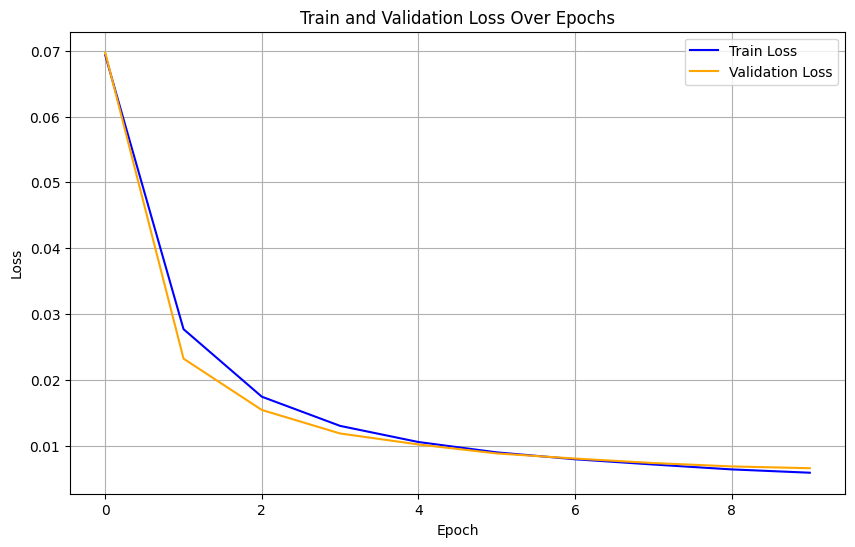

In [ ]:
colorization_model_engine = ColorizationModel(latent_dim=128)

colorization_encoder_engine, train_losses, val_losses = train_ssl_model(colorization_model_engine, 
                                       engine_train_loader, 
                                       engine_test_loader, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_engine.parameters(), lr=0.0001)
                                       )

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


#### Anomalies

In [80]:
anomaly_detector_engine_col = AnomalyDetectionModel(colorization_model_engine)
anomaly_detector_engine_col.to(device) 

anomalie_prediction_engine_col, accuracy_engine_col = anomaly_detector_engine_col.predict(engine_test_loader)

print('Accuracy prédiction anomalie engine = ', accuracy_engine_col)

Accuracy prédiction anomalie engine =  0.7140350877192982


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.053458933..1.0000002].


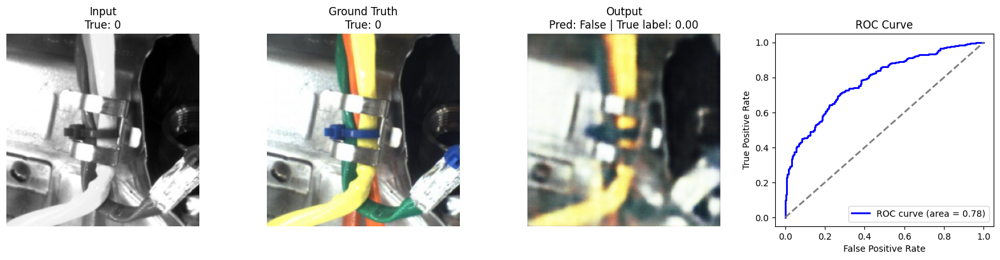

In [81]:
visualize_reconstructions_with_anomalies(colorization_model_engine, anomaly_detector_engine_col, engine_test_loader, device=device, num_images=1)

## Puzzle 

On crée un modèle puzzle, où on découpe l'image en une grille de taille 4x4. On mélange les pièces du puzzle. On encode chaque pièce du puzzle dans notre espace latent. Puis, le but est de recomposer l'image originale à l'aide des représentations dans l'espace latent.  Cela force le modèle à apprendre des représentations significatives pour chaque morceau, en se basant sur leur contenu et leur relation spatiale avec les autres morceaux.

- L'hyperparamètre ici est donc la taille de la grille qui determine en combien de morceaux nous divisons notre image. Une petite grille créé des morceaux plus grands qui contiennent plus d'informations. Il est donc plus facile pour le modèle de deviner leur position relative. Un grille plus grande créé des morceaux plus petits qui contiennent moins d'informations. Il est alors plus difficile pour le modèle de deviner leur position, nécessitant une meilleure compréhension contextuelle.

![Texte alternatif](./puzzle.png)

In [ ]:
class PuzzleModel(nn.Module):
   
    def __init__(self, latent_dim=128, grid_size=4, encoder=None):
        super(PuzzleModel, self).__init__()
        self.latent_dim = latent_dim
        self.grid_size = grid_size
        
        if encoder is None:
            self.encoder = Encoder(in_channels=3, latent_dim=latent_dim)
        else:
            self.encoder = encoder
        
       
        self.decoder = Decoder(latent_dim=latent_dim * grid_size * grid_size, out_channels=3)

    def forward(self, x):
       
        
        patches = self.split_image_into_pieces(x, self.grid_size)  
        patch_indices = list(range(self.grid_size * self.grid_size))
        random.shuffle(patch_indices)
        
        # on mélange les pièces du puzzle de manière aléatoire
        shuffled_patches = [patches[idx] for idx in patch_indices]  
        perturbed = self.combine_pieces_into_image(shuffled_patches, self.grid_size, x.size(2), x.size(3))
     

        # on encode chaque pièce du puzzle
        encoded_pieces = [self.encoder(p) for p in shuffled_patches] 
        z = torch.cat(encoded_pieces, dim=1) 
       
        reconstructed = self.decoder(z)  
        return reconstructed, perturbed

    def split_image_into_pieces(self, x, grid_size):
       
        pieces = []
        batch_size, C, H, W = x.size()
        piece_height = H // grid_size
        piece_width  = W // grid_size
        
        for i in range(grid_size):
            for j in range(grid_size):
                top = i * piece_height
                left = j * piece_width
                bottom = (i+1)*piece_height
                right = (j+1)*piece_width

                patch = x[:, :, top:bottom, left:right]
                pieces.append(patch)
        return pieces
    
    def combine_pieces_into_image(self, pieces, grid_size, H, W):
       
        batch_size = pieces[0].size(0)
        piece_h = pieces[0].size(2)
        piece_w = pieces[0].size(3)
        
        
        perturbed = torch.zeros(batch_size, 3, H, W, device=pieces[0].device)
        
        idx = 0
        for i in range(grid_size):
            for j in range(grid_size):
                top    = i * piece_h
                left   = j * piece_w
                bottom = top + piece_h
                right  = left + piece_w
                
                perturbed[:, :, top:bottom, left:right] = pieces[idx]
                idx += 1
        
        return perturbed

De devons ici changer l'AE qui prend en compte des objets de tailles différentes. 

In [89]:
# Nous devons adapter le décodeur et l'encodeur à ce modèle : la taille des éléments est différente 

class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),         
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),       
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),     
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, latent_dim, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(latent_dim),
            nn.LeakyReLU(0.2),
        )
    
    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=2048, out_channels=3):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 1024, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),      
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),        
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),       
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),        
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),          
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(32, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),
        )
    
    def forward(self, x):
        return self.decoder(x)

De la même façon, nous devons adapter la fonction d'entraînement à ce nouveau modèle. 

In [ ]:

def train_ssl_model_puzzle(model, train_loader, test_loader, criterion, optimizer, device, epochs=15):
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        model.to(device)
        model.train()
        total_train_loss = 0

        for images, _ in train_loader:
            images = images.to(device)
            optimizer.zero_grad()
            
            reconstructed, perturbed = model(images)
            
            loss = criterion(reconstructed, images)  
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # On passe à la validation
        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for images, _ in test_loader:
                images = images.to(device)
                reconstructed, perturbed = model(images)
                val_loss = criterion(reconstructed, images)
                total_val_loss += val_loss.item()

        avg_val_loss = total_val_loss / len(test_loader)
        val_losses.append(avg_val_loss)  

        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    return model.encoder, train_losses, val_losses

### Capsule

Epoch 1/15 | Train Loss: 0.0574 | Val Loss: 0.0443
Epoch 2/15 | Train Loss: 0.0250 | Val Loss: 0.0176
Epoch 3/15 | Train Loss: 0.0140 | Val Loss: 0.0103
Epoch 4/15 | Train Loss: 0.0087 | Val Loss: 0.0069
Epoch 5/15 | Train Loss: 0.0058 | Val Loss: 0.0052
Epoch 6/15 | Train Loss: 0.0041 | Val Loss: 0.0035
Epoch 7/15 | Train Loss: 0.0031 | Val Loss: 0.0028
Epoch 8/15 | Train Loss: 0.0023 | Val Loss: 0.0020
Epoch 9/15 | Train Loss: 0.0019 | Val Loss: 0.0017
Epoch 10/15 | Train Loss: 0.0015 | Val Loss: 0.0016
Epoch 11/15 | Train Loss: 0.0013 | Val Loss: 0.0015
Epoch 12/15 | Train Loss: 0.0012 | Val Loss: 0.0016
Epoch 13/15 | Train Loss: 0.0010 | Val Loss: 0.0021
Epoch 14/15 | Train Loss: 0.0009 | Val Loss: 0.0019
Epoch 15/15 | Train Loss: 0.0009 | Val Loss: 0.0019


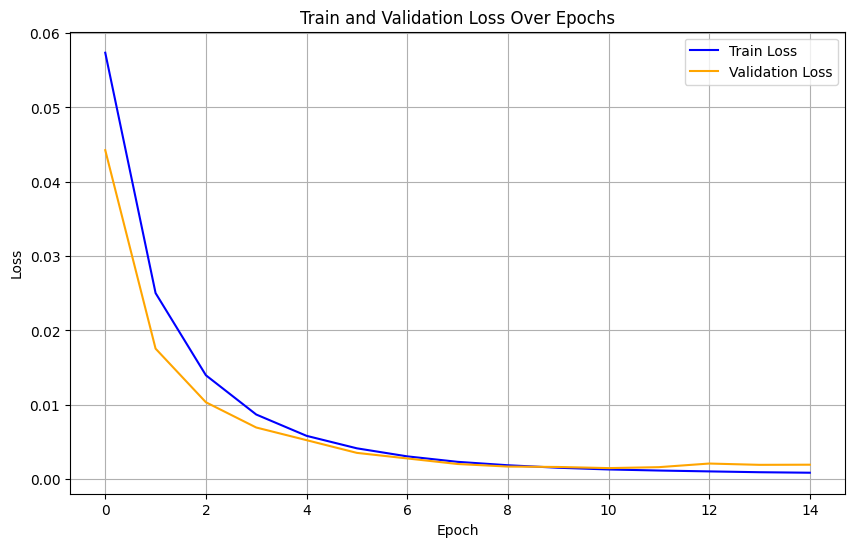

In [ ]:
puzzle_model_capsule = PuzzleModel(
    latent_dim=128, 
    grid_size=4 
)


criterion = nn.MSELoss()  
optimizer = optim.Adam(puzzle_model_capsule.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

puzzle_encoder_capsule, train_losses, val_losses = train_ssl_model_puzzle(
    puzzle_model_capsule, 
    capsule_train_loader, 
    capsule_test_loader, 
    criterion=criterion, 
    optimizer=optimizer, 
    device = device
)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

In [93]:
anomaly_detector_capsule_puzzle = AnomalyDetectionModel(puzzle_model_capsule)
anomaly_detector_capsule_puzzle.to(device) 

anomalie_prediction_capsule_puzzle, accuracy_capsule_puzzle = anomaly_detector_capsule_puzzle.predict(capsule_test_loader)

print('Accuracy prédiction anomalie capsule avec Puzzle Model = ', accuracy_capsule_puzzle)

Accuracy prédiction anomalie capsule avec Puzzle Model =  0.5652173913043478


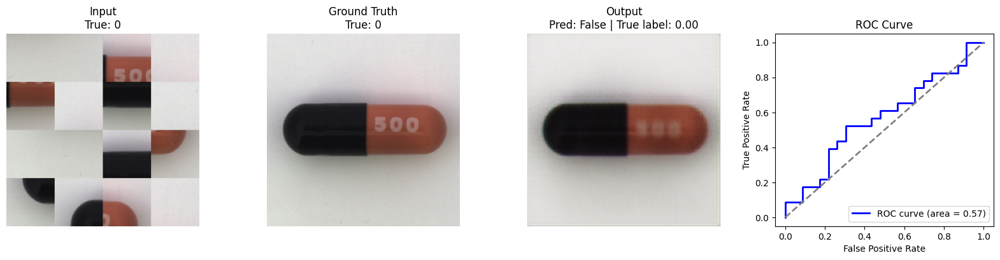

In [94]:
visualize_reconstructions_with_anomalies(puzzle_model_capsule, anomaly_detector_capsule_puzzle, capsule_test_loader, device=device, num_images=1)

### Bottle

Epoch 1/10, Train Loss: 0.1131, Val Loss: 0.0945
Epoch 2/10, Train Loss: 0.0687, Val Loss: 0.0549
Epoch 3/10, Train Loss: 0.0473, Val Loss: 0.0444
Epoch 4/10, Train Loss: 0.0343, Val Loss: 0.0307
Epoch 5/10, Train Loss: 0.0258, Val Loss: 0.0293
Epoch 6/10, Train Loss: 0.0198, Val Loss: 0.0184
Epoch 7/10, Train Loss: 0.0156, Val Loss: 0.0154
Epoch 8/10, Train Loss: 0.0126, Val Loss: 0.0139
Epoch 9/10, Train Loss: 0.0103, Val Loss: 0.0118
Epoch 10/10, Train Loss: 0.0087, Val Loss: 0.0094


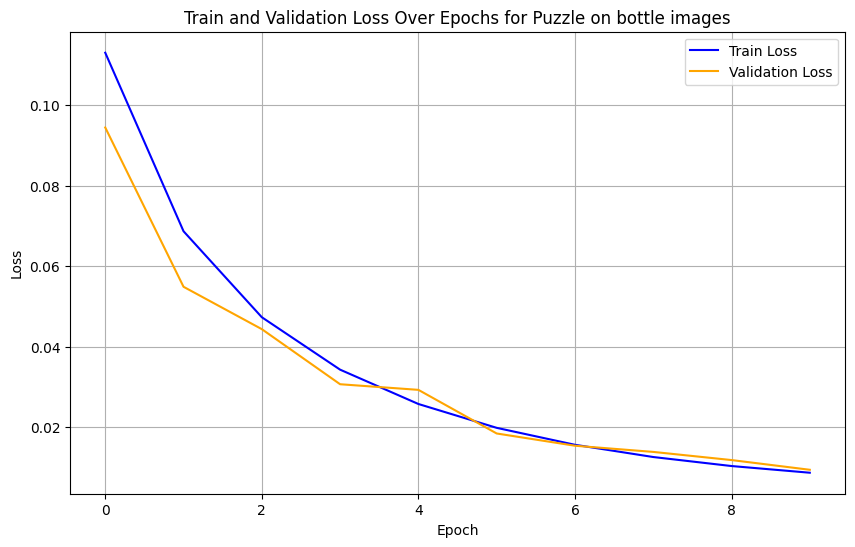

In [ ]:
puzzle_model_bottle = PuzzleModel(
    latent_dim=128, 
    grid_size=4 
)


criterion = nn.MSELoss()  
optimizer = optim.Adam(puzzle_model_bottle.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

puzzle_encoder_bottle, train_losses, val_losses = train_ssl_model(
    puzzle_model_bottle, 
    bottle_train_loader, 
    bottle_test_loader, 
    criterion=criterion, 
    optimizer=optimizer, 
    device = device
)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs for Puzzle on bottle images")
plt.legend()
plt.grid(True)
plt.show()

In [96]:
anomaly_detector_bottle_puzzle = AnomalyDetectionModel(puzzle_model_bottle)
anomaly_detector_bottle_puzzle.to(device) 

anomalie_prediction_bottle_puzzle, accuracy_bottle_puzzle = anomaly_detector_bottle_puzzle.predict(bottle_test_loader)

print('Accuracy prédiction anomalie bottle avec Puzzle Model = ', accuracy_bottle_puzzle)

Accuracy prédiction anomalie bottle avec Puzzle Model =  0.775


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11529104..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11529104..1.0000002].


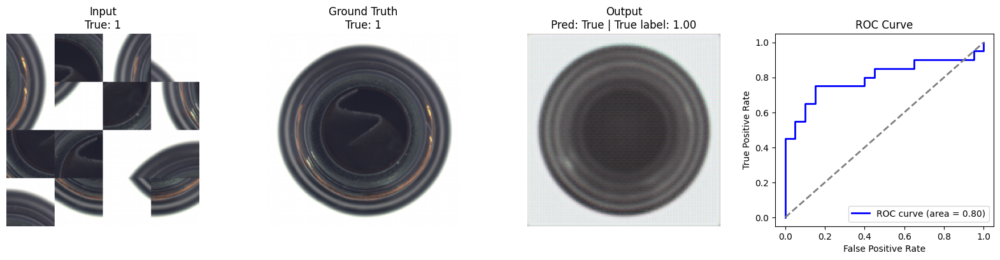

In [97]:
visualize_reconstructions_with_anomalies(puzzle_model_bottle, anomaly_detector_bottle_puzzle, bottle_test_loader, device=device, num_images=1)

### Hazelnut

#### Entrainement

Epoch 1/10, Train Loss: 0.0934, Val Loss: 0.0728
Epoch 2/10, Train Loss: 0.0548, Val Loss: 0.0365
Epoch 3/10, Train Loss: 0.0331, Val Loss: 0.0234
Epoch 4/10, Train Loss: 0.0208, Val Loss: 0.0149
Epoch 5/10, Train Loss: 0.0131, Val Loss: 0.0114
Epoch 6/10, Train Loss: 0.0084, Val Loss: 0.0069
Epoch 7/10, Train Loss: 0.0056, Val Loss: 0.0049
Epoch 8/10, Train Loss: 0.0039, Val Loss: 0.0035
Epoch 9/10, Train Loss: 0.0030, Val Loss: 0.0040
Epoch 10/10, Train Loss: 0.0024, Val Loss: 0.0029


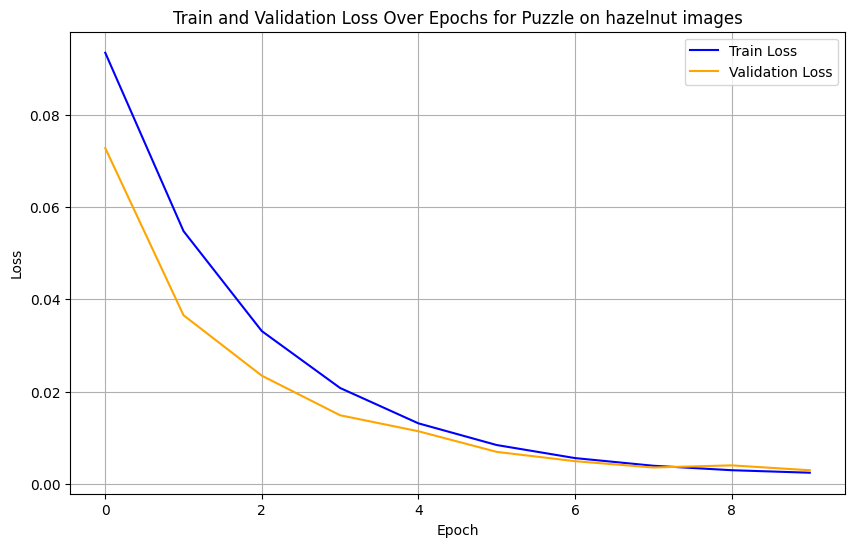

In [ ]:

puzzle_model_hazelnut = PuzzleModel(
    latent_dim=128, 
    grid_size=4 
)


criterion = nn.MSELoss()  
optimizer = optim.Adam(puzzle_model_hazelnut.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

puzzle_encoder_hazelnut, train_losses, val_losses = train_ssl_model(
    puzzle_model_hazelnut, 
    hazelnut_train_loader, 
    hazelnut_test_loader, 
    criterion=criterion, 
    optimizer=optimizer, 
    device = device
)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs for Puzzle on hazelnut images")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [99]:
anomaly_detector_hazelnut_puzzle = AnomalyDetectionModel(puzzle_model_hazelnut)
anomaly_detector_hazelnut_puzzle.to(device) 

anomalie_prediction_hazelnut_puzzle , accuracy_hazelnut_puzzle= anomaly_detector_hazelnut_puzzle.predict(hazelnut_test_loader)

print('Accuracy prédiction anomalie hazelnut avec Puzzle Model = ', accuracy_hazelnut_puzzle)

Accuracy prédiction anomalie hazelnut avec Puzzle Model =  0.675


#### Visualisation

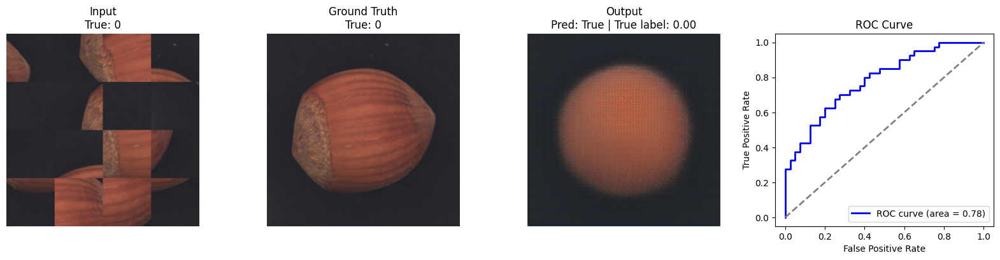

In [100]:
visualize_reconstructions_with_anomalies(puzzle_model_hazelnut, anomaly_detector_hazelnut_puzzle, hazelnut_test_loader, device=device, num_images=1)

### Toothbrush

#### Entrainement

Epoch 1/15, Train Loss: 0.1507, Val Loss: 0.1384
Epoch 2/15, Train Loss: 0.1345, Val Loss: 0.1507
Epoch 3/15, Train Loss: 0.1238, Val Loss: 0.1384
Epoch 4/15, Train Loss: 0.1140, Val Loss: 0.1198
Epoch 5/15, Train Loss: 0.1058, Val Loss: 0.1140
Epoch 6/15, Train Loss: 0.0990, Val Loss: 0.0955
Epoch 7/15, Train Loss: 0.0923, Val Loss: 0.0904
Epoch 8/15, Train Loss: 0.0853, Val Loss: 0.0790
Epoch 9/15, Train Loss: 0.0790, Val Loss: 0.0726
Epoch 10/15, Train Loss: 0.0734, Val Loss: 0.0676
Epoch 11/15, Train Loss: 0.0676, Val Loss: 0.0626
Epoch 12/15, Train Loss: 0.0626, Val Loss: 0.0576
Epoch 13/15, Train Loss: 0.0579, Val Loss: 0.0534
Epoch 14/15, Train Loss: 0.0536, Val Loss: 0.0494
Epoch 15/15, Train Loss: 0.0494, Val Loss: 0.0457


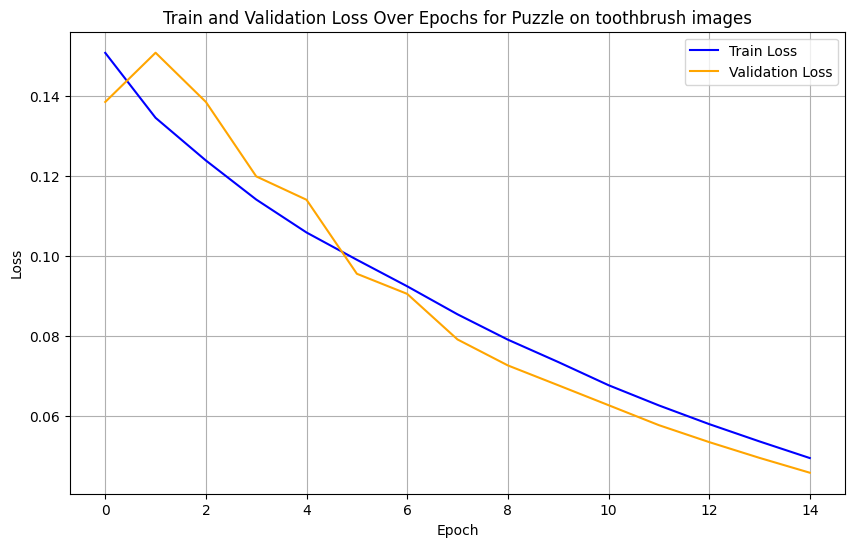

In [ ]:
puzzle_model_toothbrush = PuzzleModel(
    latent_dim=128, 
    grid_size=4 
)


criterion = nn.MSELoss()  
optimizer = optim.Adam(puzzle_model_toothbrush.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

puzzle_encoder_toothbrush, train_losses, val_losses = train_ssl_model(
    puzzle_model_toothbrush, 
    toothbrush_train_loader, 
    toothbrush_test_loader, 
    criterion=criterion, 
    optimizer=optimizer, 
    device = device, 
    epochs = 15
)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs for Puzzle on toothbrush images")
plt.legend()
plt.grid(True)
plt.show()

#### Anomalies

In [111]:
anomaly_detector_toothbrush_puzzle = AnomalyDetectionModel(puzzle_model_toothbrush)
anomaly_detector_toothbrush_puzzle.to(device) 

anomalie_prediction_toothbrush_puzzle, accuracy_toothbrush_puzzle = anomaly_detector_toothbrush_puzzle.predict(toothbrush_test_loader)

print('Accuracy prédiction anomalie hazelnut avec Puzzle Model = ', accuracy_toothbrush_puzzle)

Accuracy prédiction anomalie hazelnut avec Puzzle Model =  0.5416666666666666


#### Visualisation

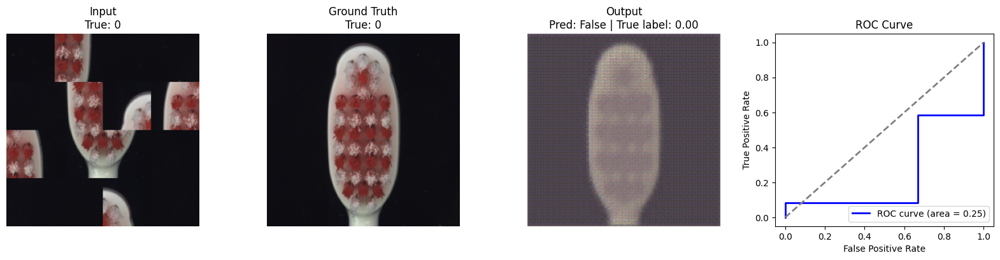

In [112]:
visualize_reconstructions_with_anomalies(puzzle_model_toothbrush, anomaly_detector_toothbrush_puzzle, toothbrush_test_loader, device=device, num_images=1)

### Engine Wiring

#### Entrainement

Epoch 1/10, Train Loss: 0.0891, Val Loss: 0.0752
Epoch 2/10, Train Loss: 0.0595, Val Loss: 0.0516
Epoch 3/10, Train Loss: 0.0462, Val Loss: 0.0489
Epoch 4/10, Train Loss: 0.0402, Val Loss: 0.0521
Epoch 5/10, Train Loss: 0.0363, Val Loss: 0.0570
Epoch 6/10, Train Loss: 0.0341, Val Loss: 0.0588
Epoch 7/10, Train Loss: 0.0306, Val Loss: 0.0672
Epoch 8/10, Train Loss: 0.0287, Val Loss: 0.0661
Epoch 9/10, Train Loss: 0.0269, Val Loss: 0.0609
Epoch 10/10, Train Loss: 0.0257, Val Loss: 0.0570


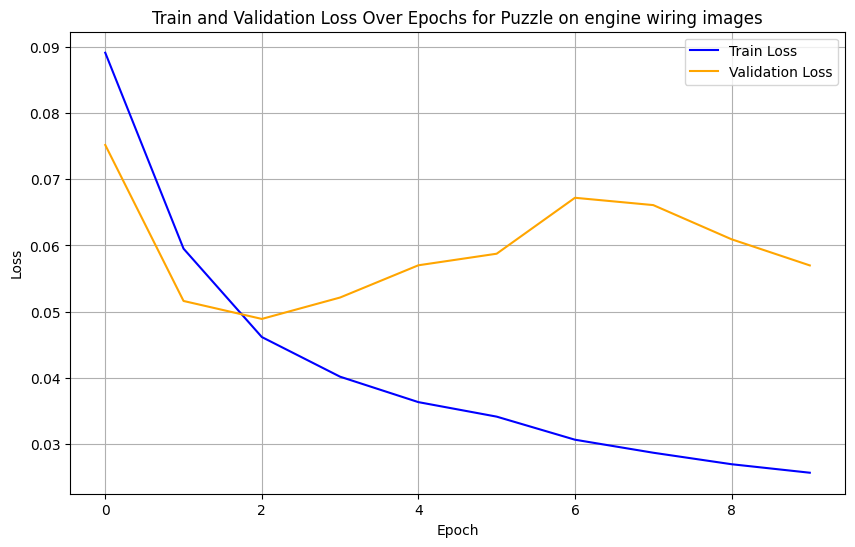

In [ ]:

puzzle_model_engine = PuzzleModel(
    latent_dim=128, 
    grid_size=4 
)


criterion = nn.MSELoss()  
optimizer = optim.Adam(puzzle_model_engine.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

puzzle_encoder_engine, train_losses, val_losses = train_ssl_model(
    puzzle_model_engine, 
    engine_train_loader, 
    engine_test_loader, 
    criterion=criterion, 
    optimizer=optimizer, 
    device = device
)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='orange')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train and Validation Loss Over Epochs for Puzzle on engine wiring images")
plt.legend()
plt.grid(True)
plt.show()

- Cette méthode fait apparaître un sur-apprentissage. 

#### Anomalies

In [106]:
anomaly_detector_engine_puzzle = AnomalyDetectionModel(puzzle_model_engine)
anomaly_detector_engine_puzzle.to(device) 

anomalie_prediction_engine_puzzle, accuracy_engine_puzzle = anomaly_detector_engine_puzzle.predict(engine_test_loader)

print('Accuracy prédiction anomalie engine avec Puzzle Model = ', accuracy_engine_puzzle)

Accuracy prédiction anomalie engine avec Puzzle Model =  0.6157894736842106


#### Visualisation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036346406..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036346406..1.0000002].


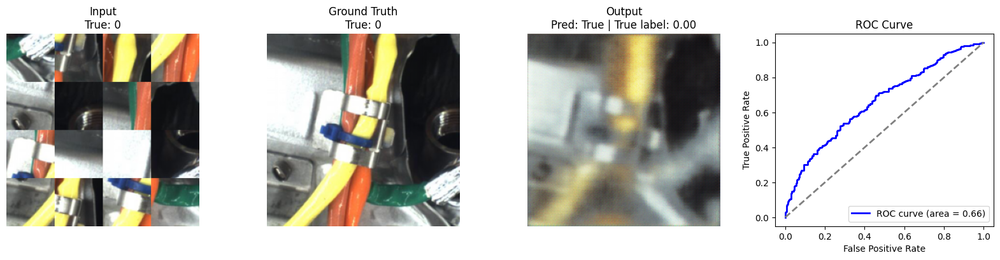

In [107]:
visualize_reconstructions_with_anomalies(puzzle_model_engine, anomaly_detector_engine_puzzle, engine_test_loader, device=device, num_images=1)

## Comparaison des modèles 

On cherche le modèle de 'dégradation' de nos images initiales qui nous permet de mieux apprendre à reconstruire et de mieux détecter les anomalies pour chaque set d'images. 

In [ ]:
import pandas as pd

# Dictionnaire des données
data = {
    "Capsule": [
        accuracy_capsule_mae, accuracy_capsule_inp, accuracy_capsule_col , accuracy_capsule_puzzle
    ],
    "Bottle": [
        accuracy_bottle_mae, accuracy_bottle_inp, accuracy_bottle_col , accuracy_bottle_puzzle
    ],
    "Hazelnut": [
        accuracy_hazelnut_mae, accuracy_hazelnut_inp, accuracy_hazelnut_col , accuracy_hazelnut_puzzle
    ],
    "Toothbrush": [
        accuracy_toothbrush_mae, accuracy_toothbrush_inp, accuracy_toothbrush_col , accuracy_toothbrush_puzzle
    ],
    "Engine": [
        accuracy_engine_mae, accuracy_engine_inp, accuracy_engine_col , accuracy_engine_puzzle
    ],
}

methods = ["MAE", "INP", "COL", "PUZ"]

df_accuracy = pd.DataFrame(data, index=methods)


In [ ]:

def highlight_max(s):
    is_max = s == s.max()  
    return ["background-color: #b6fcb6" if v else "" for v in is_max]


styled_df = df_accuracy.style.apply(highlight_max, subset=df_accuracy.columns)


styled_df


,Capsule,Bottle,Hazelnut,Toothbrush,Engine
MAE,0.630435,0.800000,0.762500,0.666667,0.652632
INP,0.652174,0.775000,0.737500,0.500000,0.580702
COL,0.608696,0.775000,0.750000,0.500000,0.714035
PUZ,0.565217,0.775000,0.675000,0.500000,0.615789


- Il semblerait que la méthode mask soit  celle qui permette à notre modèle d'apprendre le mieux la reconstruction et lui permet ensuite de détecter correctement les anomalies.

### Conclusion : 

D'un point de vue modèle et performance de reconstruction des images, nous avons remarqué plusieurs points intéressants à propos des modèles :

- Pour le modèle Colorizing, le modèle permet de bien reconstruire les structures des objets au sein de l'image (par exemple Hazelnut ou Bottle). Cependant, il est plus difficile de reconstruire les couleurs exactes des images en entrée et a tendance à floutter l'intérieur des objets au sein de l'image. Ceci est dû au fait qu'il prend une moyenne de la couleur au sein de la structure, afin de ne pas se tromper, et donc proposer une reconstruction d'une image qui selon lui est satisfaisante, mais qui ne l'est pas pour nous.

- Pour le modèle Inpainting, il arrive à bien reconstruire les couleurs de l'image en entrée. Cependant, il a besoin de bien comprendre la structure spatiale de l'image. En effet, le modèle inpainting est limité si la zone masquée est trop petite ou si l'image présente des textures très complexes, comme sur le jeu de données Engine Wiring.

- Pour le modèle Masked AutoEncoder, il se trouve que c'est le plus performant. Il arrive à capter les détails globaux de la structure de l'image, ainsi que les détails locaux. Cette performance est nettement conditionnée par le ratio de pixels masqués par notre modèle.

- Enfin, pour le pretext du puzzle, les performances dépendent de la compléxité des structures globales et locales de l'image. En effet, nous pouvons remarquer que le modèle performe très mal pour des structures complexes comme toothbruh ou Engine Wiring. Et aussi, il arrive à très bien performer pour des images comme celles de Bottle. 